In [ ]:
import nltk
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer
import os
import numpy as np
import csv
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.dates import DateFormatter
import math
import time
import tensorflow as tf
from tensorflow.keras.layers import GRU, LSTM, Bidirectional, Dense, Flatten, Conv1D, BatchNormalization, LeakyReLU, Dropout
from tensorflow.keras import Sequential
from sklearn.metrics import mean_squared_error
from tqdm import tqdm
import statsmodels.api as sm
from math import sqrt
from datetime import datetime, timedelta
from sklearn.preprocessing import MinMaxScaler
from nltk.sentiment.vader import SentimentIntensityAnalyzer
import warnings
warnings.filterwarnings("ignore")
import unicodedata
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer

In [ ]:
import nltk
nltk.download('vader_lexicon')

[nltk_data] Downloading package vader_lexicon to
[nltk_data]     C:\Users\danus\AppData\Roaming\nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


True

In [ ]:
df = pd.read_excel('./tweet data/stock_tweets_selected_automobile.xlsx')

'Step 1: Data Preprocessing and EDA'


In [ ]:
df.head()

,Date,Tweet,Stock Name,Company Name
0,2022-09-29 23:41:16+00:00,Mainstream media has done an amazing job at br...,TSLA,"Tesla, Inc."
1,2022-09-29 23:24:43+00:00,Tesla delivery estimates are at around 364k fr...,TSLA,"Tesla, Inc."
2,2022-09-29 23:18:08+00:00,3/ Even if I include 63.0M unvested RSUs as of...,TSLA,"Tesla, Inc."
3,2022-09-29 22:40:07+00:00,@RealDanODowd @WholeMarsBlog @Tesla Hahaha why...,TSLA,"Tesla, Inc."
4,2022-09-29 22:27:05+00:00,"@RealDanODowd @Tesla Stop trying to kill kids,...",TSLA,"Tesla, Inc."


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 40699 entries, 0 to 40698
Data columns (total 4 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Date          40699 non-null  object
 1   Tweet         40699 non-null  object
 2   Stock Name    40699 non-null  object
 3   Company Name  40699 non-null  object
dtypes: object(4)
memory usage: 1.2+ MB


In [ ]:
df.describe()

,Date,Tweet,Stock Name,Company Name
count,40699,40699,40699,40699
unique,40132,40135,4,4
top,2021-11-11 01:54:37+00:00,$TSLA will triple in 2022 🚀🌕,TSLA,"Tesla, Inc."
freq,3,25,37422,37422


In [ ]:
df['Stock Name'].value_counts()

Stock Name
TSLA    37422
NIO      3021
XPEV      225
F          31
Name: count, dtype: int64

In [ ]:
df.shape

(40699, 4)

In [ ]:
df.columns

Index(['Date', 'Tweet', 'Stock Name', 'Company Name'], dtype='object')

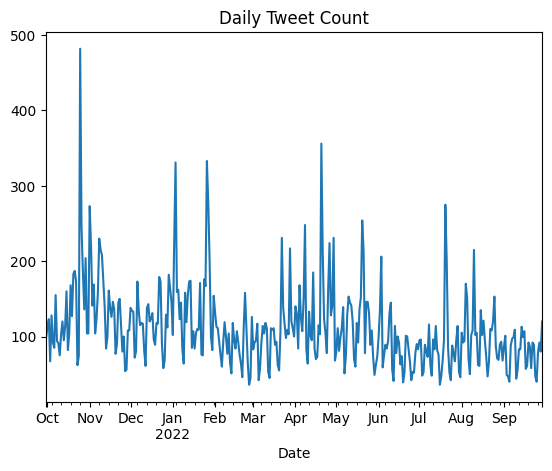

In [ ]:

# Plot distribution of tweets over time
df['Date'] = pd.to_datetime(df['Date'])
df.set_index('Date', inplace=True)
df['Tweet'].resample('D').count().plot(title='Daily Tweet Count')
plt.show()

<Axes: xlabel='Stock Name'>

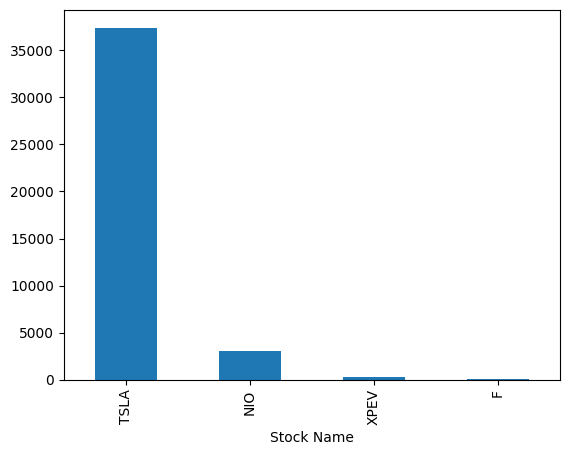

In [ ]:
df['Stock Name'].value_counts().plot(kind='bar')

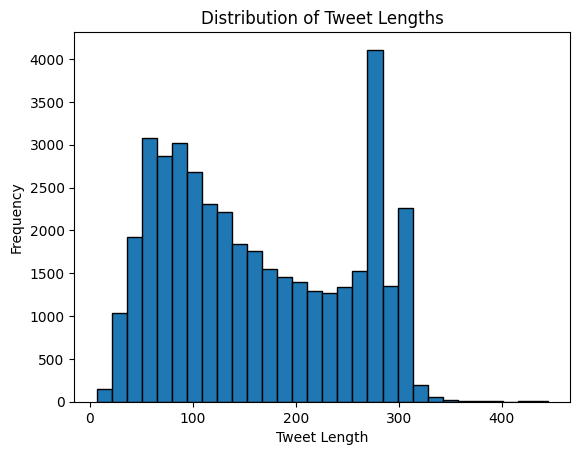

In [ ]:
# Explore the distribution of tweet lengths
df['Tweet Length'] = df['Tweet'].apply(len)
plt.hist(df['Tweet Length'], bins=30, edgecolor='black')
plt.title('Distribution of Tweet Lengths')
plt.xlabel('Tweet Length')
plt.ylabel('Frequency')
plt.show()

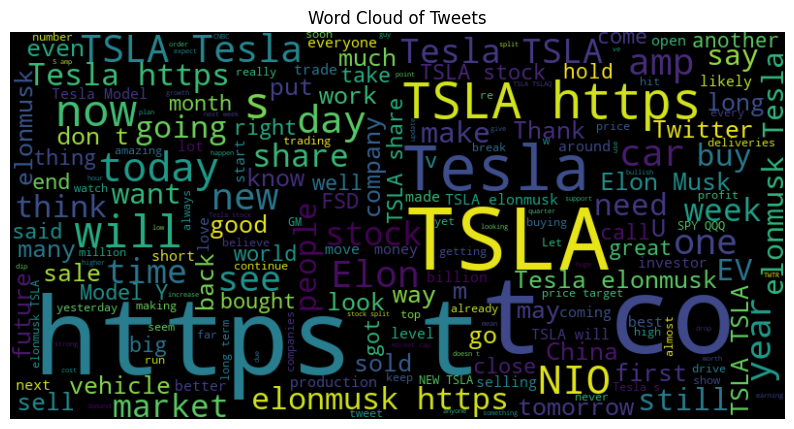

In [ ]:
# Explore the most common words in tweets
from wordcloud import WordCloud

# Combine all tweets into a single string
all_tweets = ' '.join(df['Tweet'])

# Generate a word cloud
wordcloud = WordCloud(width=800, height=400, random_state=21, max_font_size=110).generate(all_tweets)
plt.figure(figsize=(10, 7))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis('off')
plt.title('Word Cloud of Tweets')
plt.show()


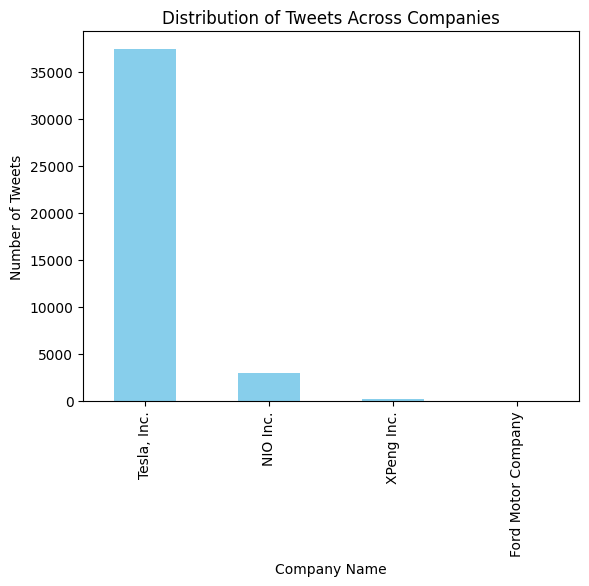

In [ ]:

# Explore the distribution of tweets across different companies
company_counts = df['Company Name'].value_counts()
company_counts.plot(kind='bar', color='skyblue')
plt.title('Distribution of Tweets Across Companies')
plt.xlabel('Company Name')
plt.ylabel('Number of Tweets')
plt.show()

In [ ]:
# Display the counts of tweets for each company
print("Counts of Tweets for Each Company:")
print(company_counts)

Counts of Tweets for Each Company:
Company Name
Tesla, Inc.           37422
NIO Inc.               3021
XPeng Inc.              225
Ford Motor Company       31
Name: count, dtype: int64


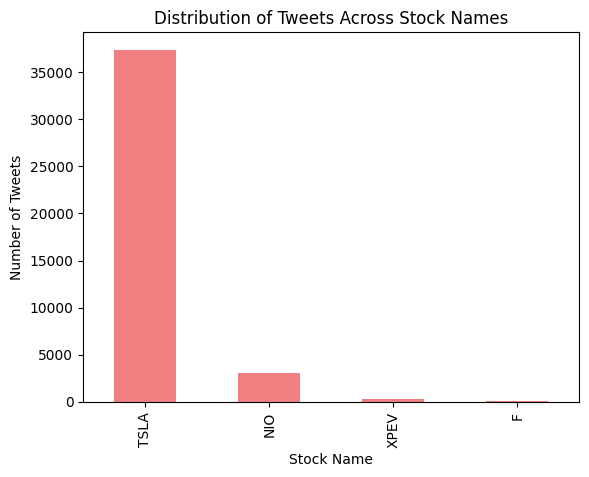


Counts of Tweets for Each Stock Name:
Stock Name
TSLA    37422
NIO      3021
XPEV      225
F          31
Name: count, dtype: int64


In [ ]:
# Explore the distribution of tweets across different stock names
stock_counts = df['Stock Name'].value_counts()
stock_counts.plot(kind='bar', color='lightcoral')
plt.title('Distribution of Tweets Across Stock Names')
plt.xlabel('Stock Name')
plt.ylabel('Number of Tweets')
plt.show()

# Display the counts of tweets for each stock name
print("\nCounts of Tweets for Each Stock Name:")
print(stock_counts)

In [ ]:
null_values = df.isnull().sum()
print("Null Values in the Dataset:")
print(null_values)

Null Values in the Dataset:
Tweet           0
Stock Name      0
Company Name    0
dtype: int64


In [ ]:
# Check for duplicates in the dataset
duplicate_rows = df[df.duplicated()]
print("\nNumber of Duplicate Rows:", duplicate_rows.shape[0])


Number of Duplicate Rows: 154


Step 2: Sentiment Analysis

In [ ]:
# Perform sentiment analysis using a library like TextBlob or VaderSentiment
from textblob import TextBlob

# Function to classify sentiment
def get_sentiment(text):
    analysis = TextBlob(text)
    if analysis.sentiment.polarity > 0:
        return 'Positive'
    elif analysis.sentiment.polarity == 0:
        return 'Neutral'
    else:
        return 'Negative'

# Apply sentiment analysis to the 'Tweet' column
df['Sentiment'] = df['Tweet'].apply(get_sentiment)



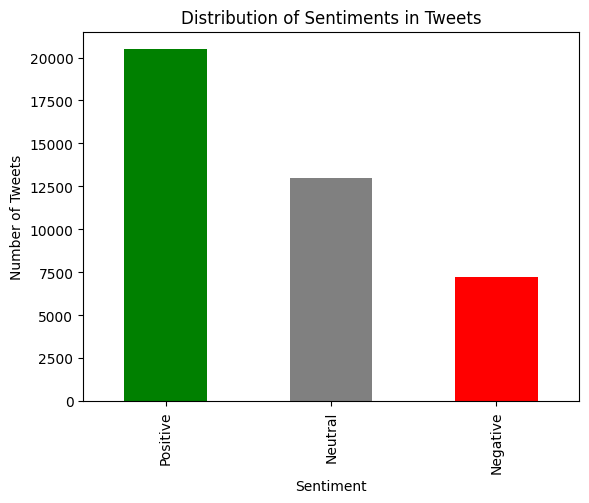

In [ ]:
# Visualize the distribution of sentiments
sentiment_counts = df['Sentiment'].value_counts()
sentiment_counts.plot(kind='bar', color=['green', 'gray', 'red'])
plt.title('Distribution of Sentiments in Tweets')
plt.xlabel('Sentiment')
plt.ylabel('Number of Tweets')
plt.show()


In [ ]:
analyzer = SentimentIntensityAnalyzer()
analyzer

In [ ]:
df['Sentiment'].value_counts()

Sentiment
Positive    20484
Neutral     12979
Negative     7236
Name: count, dtype: int64

In [ ]:
df['Sentiment_score'] = df['Tweet'].apply(lambda text: analyzer.polarity_scores(text)['compound'])


mean_sentiment = df['Sentiment_score'].mean()
std_sentiment = df['Sentiment_score'].std()
df['Z-Score'] = (df['Sentiment_score'] - mean_sentiment) / std_sentiment


threshold = 2.0

anomalies = df[df['Z-Score'].abs() > threshold]

print("Sentiment Analysis Results:")
print(df)

print("\nAnomalies:")
print(anomalies)

Sentiment Analysis Results:
                                                                       Tweet  \
Date                                                                           
2022-09-29 23:41:16+00:00  Mainstream media has done an amazing job at br...   
2022-09-29 23:24:43+00:00  Tesla delivery estimates are at around 364k fr...   
2022-09-29 23:18:08+00:00  3/ Even if I include 63.0M unvested RSUs as of...   
2022-09-29 22:40:07+00:00  @RealDanODowd @WholeMarsBlog @Tesla Hahaha why...   
2022-09-29 22:27:05+00:00  @RealDanODowd @Tesla Stop trying to kill kids,...   
...                                                                      ...   
2021-10-07 17:11:57+00:00  Some of the fastest growing tech stocks on the...   
2021-10-04 17:05:59+00:00  With earnings on the horizon, here is a quick ...   
2021-10-01 04:43:41+00:00  Our record delivery results are a testimony of...   
2021-10-01 00:03:32+00:00  We delivered 10,412 Smart EVs in Sep 2021, rea...   
2021-09-30 1

In [ ]:
df.head()


,Tweet,Stock Name,Company Name,Sentiment,Sentiment_score,Z-Score
Date,,,,,,
2022-09-29 23:41:16+00:00,Mainstream media has done an amazing job at br...,TSLA,"Tesla, Inc.",Positive,0.0772,-0.233006
2022-09-29 23:24:43+00:00,Tesla delivery estimates are at around 364k fr...,TSLA,"Tesla, Inc.",Neutral,0.0000,-0.405396
2022-09-29 23:18:08+00:00,3/ Even if I include 63.0M unvested RSUs as of...,TSLA,"Tesla, Inc.",Positive,0.2960,0.255584
2022-09-29 22:40:07+00:00,@RealDanODowd @WholeMarsBlog @Tesla Hahaha why...,TSLA,"Tesla, Inc.",Positive,-0.7568,-2.095361
2022-09-29 22:27:05+00:00,"@RealDanODowd @Tesla Stop trying to kill kids,...",TSLA,"Tesla, Inc.",Negative,-0.8750,-2.359307


In [ ]:
df.tail()

,Tweet,Stock Name,Company Name,Sentiment,Sentiment_score,Z-Score
Date,,,,,,
2021-10-07 17:11:57+00:00,Some of the fastest growing tech stocks on the...,XPEV,XPeng Inc.,Neutral,0.1779,-0.008138
2021-10-04 17:05:59+00:00,"With earnings on the horizon, here is a quick ...",XPEV,XPeng Inc.,Positive,0.3818,0.447179
2021-10-01 04:43:41+00:00,Our record delivery results are a testimony of...,XPEV,XPeng Inc.,Neutral,0.4215,0.535830
2021-10-01 00:03:32+00:00,"We delivered 10,412 Smart EVs in Sep 2021, rea...",XPEV,XPeng Inc.,Positive,0.5423,0.805582
2021-09-30 10:22:52+00:00,Why can XPeng P5 deliver outstanding performan...,XPEV,XPeng Inc.,Positive,0.7783,1.332579


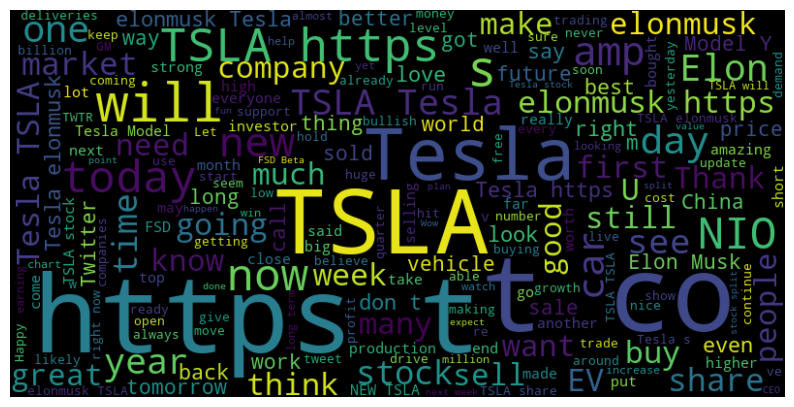

In [ ]:
# Word Cloud for Positive, Neutral, and Negative Sentiments
def plot_wordcloud(sentiment):
    words = ' '.join(df[df['Sentiment'] == sentiment]['Tweet'])
    wordcloud = WordCloud(width=800, height=400, random_state=21, max_font_size=110).generate(words)
    plt.figure(figsize=(10, 7))
    plt.imshow(wordcloud, interpolation="bilinear")
    plt.axis('off')
    plt.show()

plot_wordcloud('Positive')


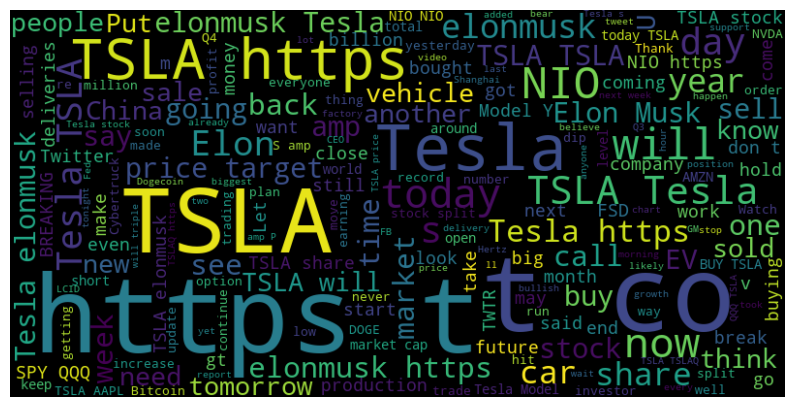

In [ ]:
plot_wordcloud('Neutral')

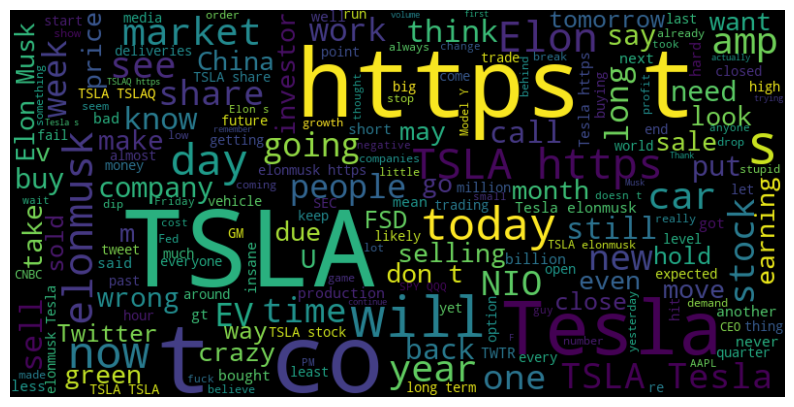

In [ ]:
plot_wordcloud('Negative')

In [ ]:
from sklearn.feature_extraction.text import CountVectorizer
from wordcloud import WordCloud
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.naive_bayes import MultinomialNB
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.metrics import roc_curve, auc
import seaborn as sns
from sklearn.preprocessing import label_binarize
from sklearn.multiclass import OneVsRestClassifier
from itertools import cycle

In [ ]:

X_train, X_test, y_train, y_test = train_test_split(df['Tweet'], df['Sentiment'], test_size=0.2, random_state=42)

# Convert text data to numerical features using TF-IDF Vectorizer
tfidf_vectorizer = TfidfVectorizer(stop_words='english', max_df=0.7)
tfidf_train = tfidf_vectorizer.fit_transform(X_train)
tfidf_test = tfidf_vectorizer.transform(X_test)

naive_bayes = MultinomialNB()
naive_bayes.fit(tfidf_train, y_train)


y_pred = naive_bayes.predict(tfidf_test)




In [ ]:
y_pred

array(['Negative', 'Positive', 'Positive', ..., 'Positive', 'Positive',
       'Positive'], dtype='<U8')

In [ ]:
print("Classification Report:\n", classification_report(y_test, y_pred))

Classification Report:
               precision    recall  f1-score   support

    Negative       0.95      0.01      0.03      1437
     Neutral       0.89      0.13      0.22      2650
    Positive       0.52      0.99      0.68      4053

    accuracy                           0.54      8140
   macro avg       0.79      0.38      0.31      8140
weighted avg       0.72      0.54      0.42      8140



In [ ]:

print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred))

Confusion Matrix:
 [[  21   15 1401]
 [   1  340 2309]
 [   0   28 4025]]


In [ ]:
from sklearn.metrics import accuracy_score

Accuracy: 0.5388


Precision: 0.7166
Recall: 0.5388
F1 Score: 0.4181


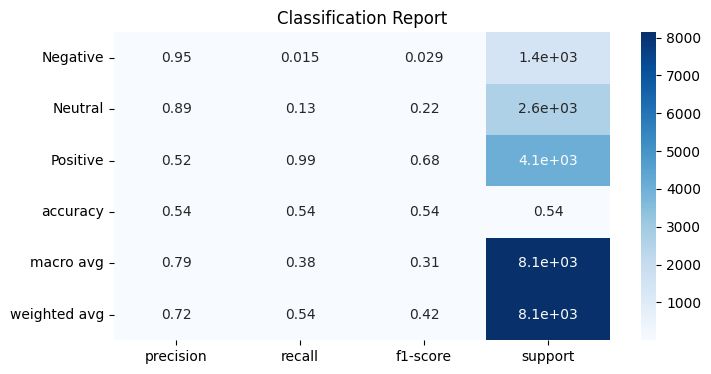

In [ ]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

# Calculate accuracy
accuracy = accuracy_score(y_test, y_pred)
print(f'Accuracy: {accuracy:.4f}')

# Calculate precision, recall, and F1-score
precision = precision_score(y_test, y_pred, average='weighted')
recall = recall_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')

print(f'Precision: {precision:.4f}')
print(f'Recall: {recall:.4f}')
print(f'F1 Score: {f1:.4f}')



# Plotting the Classification Report
plt.figure(figsize=(8, 4))
sns.heatmap(pd.DataFrame(classification_report(y_test, y_pred, output_dict=True)).T, annot=True, cmap="Blues")
plt.title('Classification Report')
plt.show()



In [ ]:
# Function to plot confusion matrix
def plot_confusion_matrix(y_true, y_pred, classes):
    cm = confusion_matrix(y_true, y_pred)
    plt.figure(figsize=(8, 8))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=classes, yticklabels=classes)
    plt.title('Confusion Matrix')
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.show()

In [ ]:
# Function to plot ROC-AUC curve
def plot_roc_curve(y_true, y_prob, classes):
    y_bin = label_binarize(y_true, classes=classes)
    n_classes = len(classes)

    fpr = dict()
    tpr = dict()
    roc_auc = dict()

    for i in range(n_classes):
        fpr[i], tpr[i], _ = roc_curve(y_bin[:, i], y_prob[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])

    colors = cycle(['blue', 'red', 'green'])
    plt.figure(figsize=(8, 8))

    for i, color in zip(range(n_classes), colors):
        plt.plot(fpr[i], tpr[i], color=color, lw=2,
                 label=f'ROC curve (area = {roc_auc[i]:.2f}) for class {classes[i]}')

    plt.plot([0, 1], [0, 1], 'k--', lw=2)
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC-AUC Curve')
    plt.legend(loc="lower right")
    plt.show()

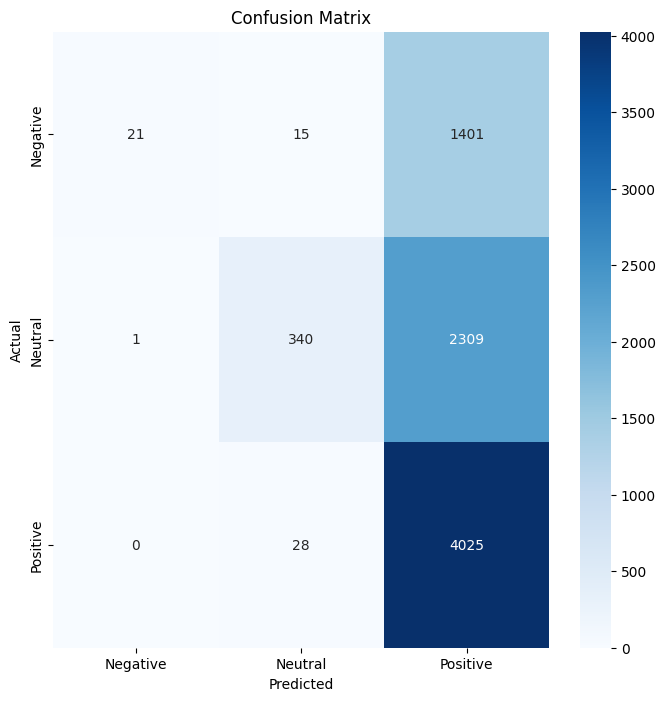

In [ ]:
# Plotting the Confusion Matrix
plot_confusion_matrix(y_test, y_pred, classes=['Negative', 'Neutral', 'Positive'])


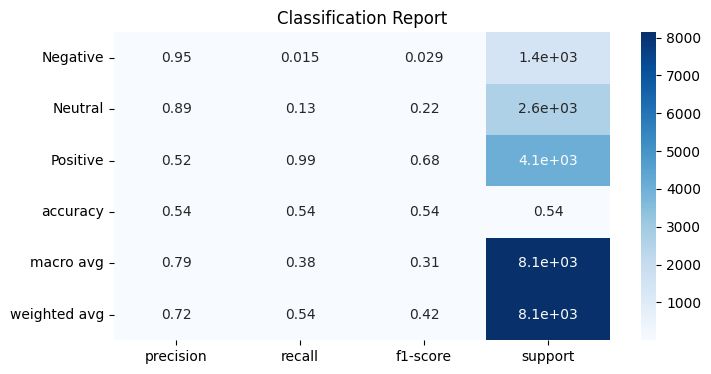

In [ ]:
# Plotting the Classification Report
plt.figure(figsize=(8, 4))
sns.heatmap(pd.DataFrame(classification_report(y_test, y_pred, output_dict=True)).T, annot=True, cmap="Blues")
plt.title('Classification Report')
plt.show()

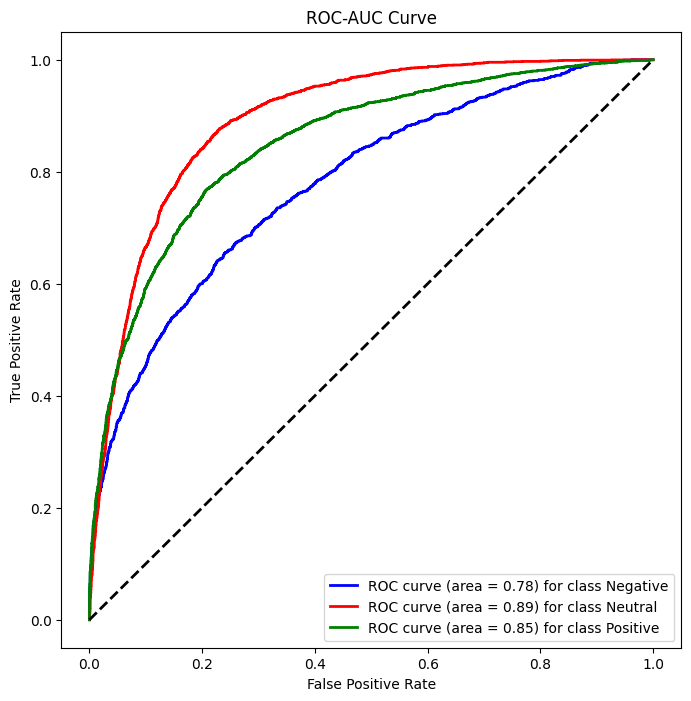

In [ ]:
# Plotting the ROC-AUC Curve
y_prob = naive_bayes.predict_proba(tfidf_test)
plot_roc_curve(y_test, y_prob, classes=['Negative', 'Neutral', 'Positive'])

Naive Bayes Accuracy: 0.5388206388206388
Random Forest Accuracy: 0.7563882063882064
SVM Accuracy: 0.8027027027027027
Decision Tree Accuracy: 0.6961916461916462
K-Nearest Neighbors Accuracy: 0.34705159705159705


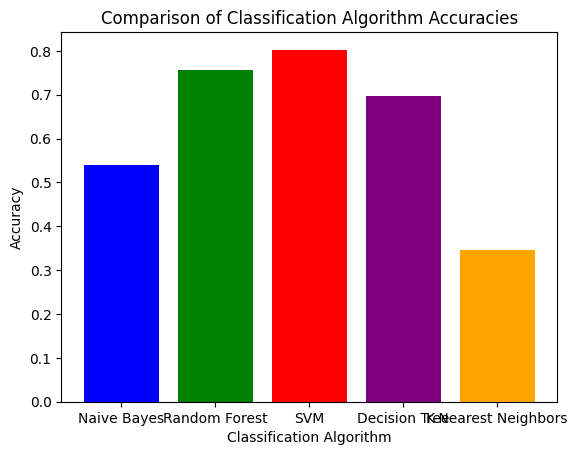

In [ ]:
# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(df['Tweet'], df['Sentiment'], test_size=0.2, random_state=42)

# Convert text data to numerical features using TF-IDF Vectorizer
tfidf_vectorizer = TfidfVectorizer(stop_words='english', max_df=0.7)
tfidf_train = tfidf_vectorizer.fit_transform(X_train)
tfidf_test = tfidf_vectorizer.transform(X_test)



# Naive Bayes
naive_bayes = MultinomialNB()
naive_bayes.fit(tfidf_train, y_train)
naive_bayes_pred = naive_bayes.predict(tfidf_test)
naive_bayes_accuracy = accuracy_score(y_test, naive_bayes_pred)
print("Naive Bayes Accuracy:", naive_bayes_accuracy)

# Random Forest
from sklearn.ensemble import RandomForestClassifier
random_forest = RandomForestClassifier(n_estimators=100, random_state=42)
random_forest.fit(tfidf_train, y_train)
random_forest_pred = random_forest.predict(tfidf_test)
random_forest_accuracy = accuracy_score(y_test, random_forest_pred)
print("Random Forest Accuracy:", random_forest_accuracy)

# Support Vector Machine
from sklearn.svm import SVC
svm_classifier = SVC(kernel='linear', C=1)
svm_classifier.fit(tfidf_train, y_train)
svm_pred = svm_classifier.predict(tfidf_test)
svm_accuracy = accuracy_score(y_test, svm_pred)
print("SVM Accuracy:", svm_accuracy)

# Decision Tree
from sklearn.tree import DecisionTreeClassifier
decision_tree = DecisionTreeClassifier(random_state=42)
decision_tree.fit(tfidf_train, y_train)
decision_tree_pred = decision_tree.predict(tfidf_test)
decision_tree_accuracy = accuracy_score(y_test, decision_tree_pred)
print("Decision Tree Accuracy:", decision_tree_accuracy)

# K-Nearest Neighbors
from sklearn.neighbors import KNeighborsClassifier
knn_classifier = KNeighborsClassifier(n_neighbors=5)
knn_classifier.fit(tfidf_train, y_train)
knn_pred = knn_classifier.predict(tfidf_test)
knn_accuracy = accuracy_score(y_test, knn_pred)
print("K-Nearest Neighbors Accuracy:", knn_accuracy)

# Compare and visualize the accuracies
accuracies = {
    'Naive Bayes': naive_bayes_accuracy,
    'Random Forest': random_forest_accuracy,
    'SVM': svm_accuracy,
    'Decision Tree': decision_tree_accuracy,
    'K-Nearest Neighbors': knn_accuracy
}

plt.bar(accuracies.keys(), accuracies.values(), color=['blue', 'green', 'red', 'purple', 'orange'])
plt.title('Comparison of Classification Algorithm Accuracies')
plt.xlabel('Classification Algorithm')
plt.ylabel('Accuracy')
plt.show()


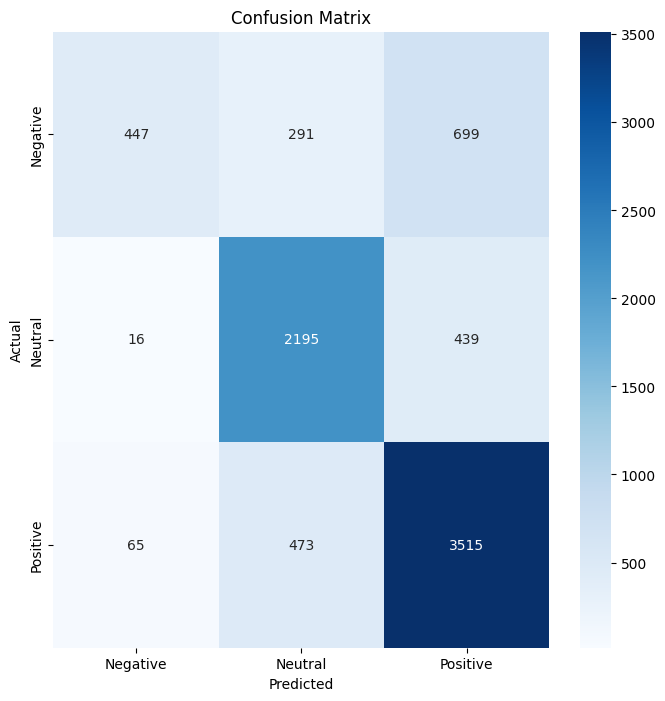

Classification Report - Random Forest:
               precision    recall  f1-score   support

    Negative       0.85      0.31      0.45      1437
     Neutral       0.74      0.83      0.78      2650
    Positive       0.76      0.87      0.81      4053

    accuracy                           0.76      8140
   macro avg       0.78      0.67      0.68      8140
weighted avg       0.77      0.76      0.74      8140



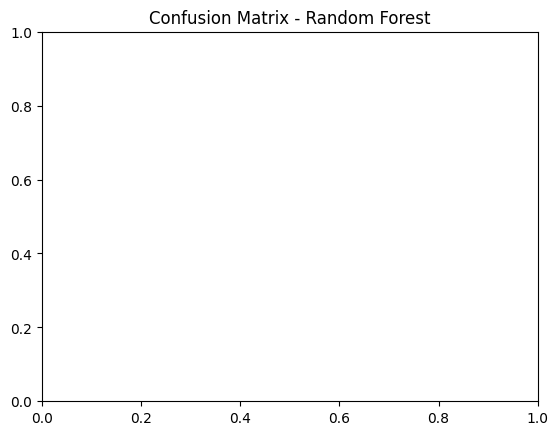

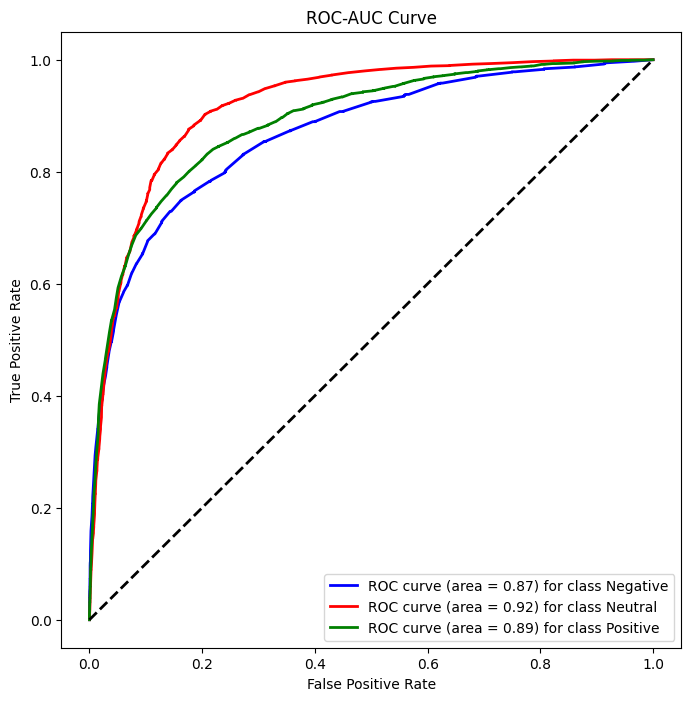

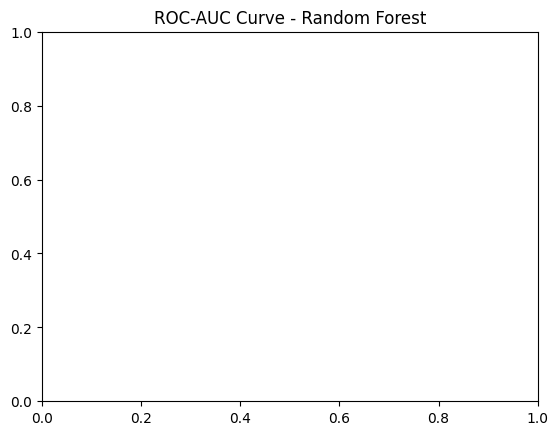

In [ ]:
# Confusion Matrix for Random Forest
plot_confusion_matrix(y_test, random_forest_pred, classes=['Negative', 'Neutral', 'Positive'])
plt.title('Confusion Matrix - Random Forest')
# Classification Report for Random Forest
print("Classification Report - Random Forest:\n", classification_report(y_test, random_forest_pred))

# ROC-AUC Curve for Random Forest
random_forest_prob = random_forest.predict_proba(tfidf_test)
plot_roc_curve(y_test, random_forest_prob, classes=['Negative', 'Neutral', 'Positive'])
plt.title('ROC-AUC Curve - Random Forest')
plt.show()


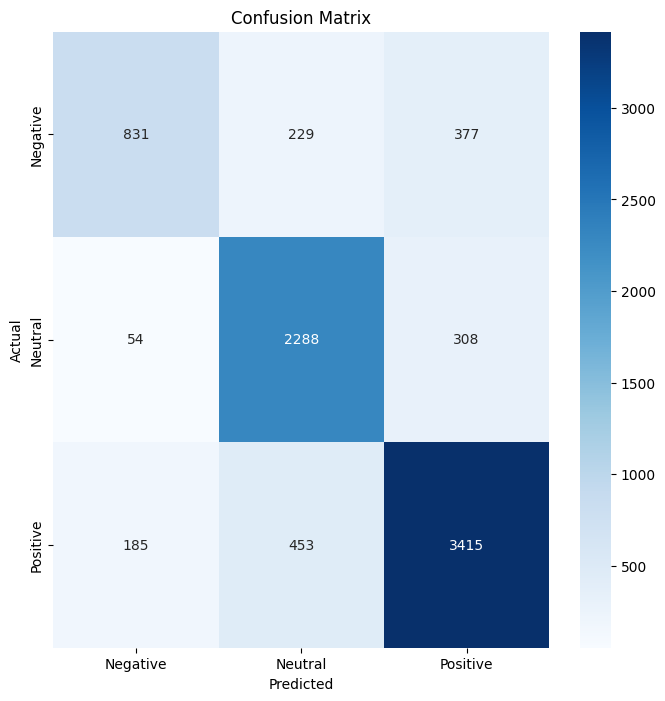

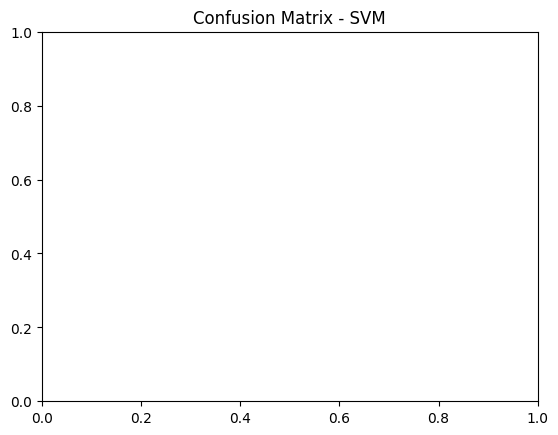

Classification Report - SVM:
               precision    recall  f1-score   support

    Negative       0.78      0.58      0.66      1437
     Neutral       0.77      0.86      0.81      2650
    Positive       0.83      0.84      0.84      4053

    accuracy                           0.80      8140
   macro avg       0.79      0.76      0.77      8140
weighted avg       0.80      0.80      0.80      8140



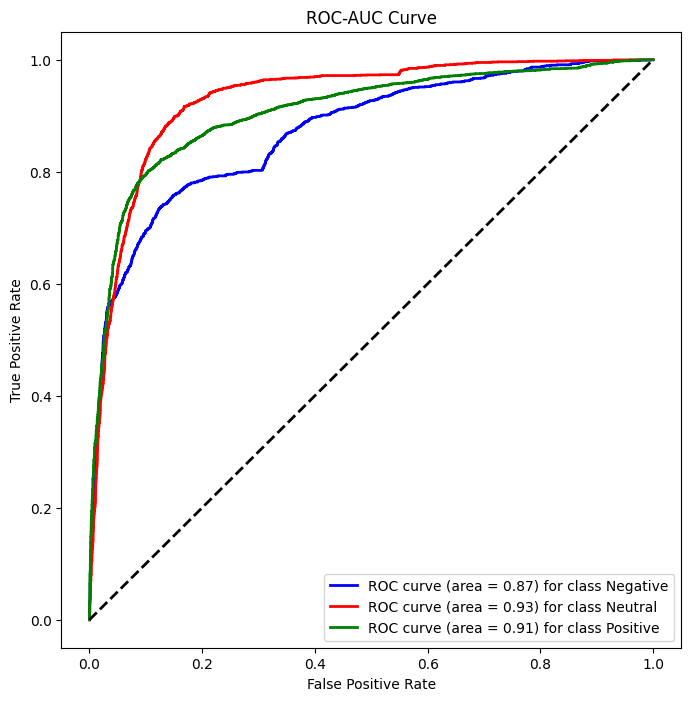

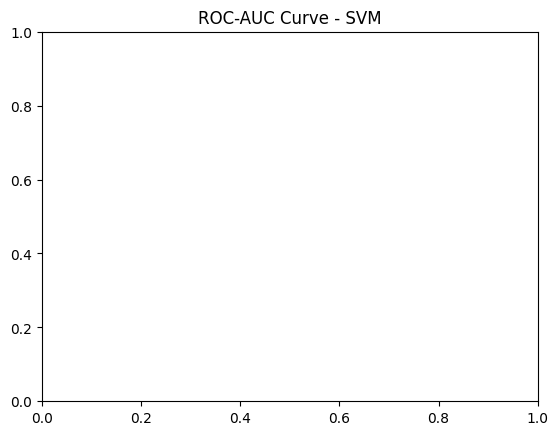

In [ ]:
# Confusion Matrix for SVM
plot_confusion_matrix(y_test, svm_pred, classes=['Negative', 'Neutral', 'Positive'])
plt.title('Confusion Matrix - SVM')
plt.show()

# Classification Report for SVM
print("Classification Report - SVM:\n", classification_report(y_test, svm_pred))

# ROC-AUC Curve for SVM
svm_prob = svm_classifier.decision_function(tfidf_test)
plot_roc_curve(y_test, svm_prob, classes=['Negative', 'Neutral', 'Positive'])
plt.title('ROC-AUC Curve - SVM')
plt.show()


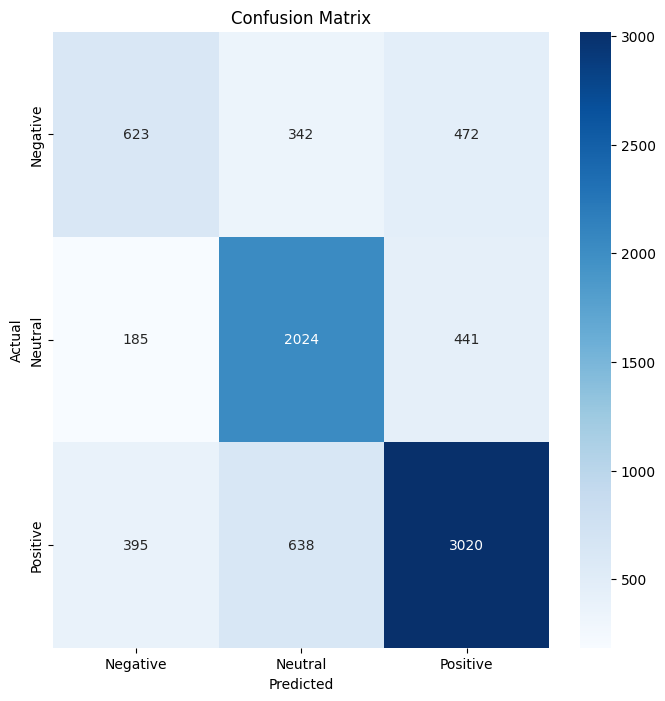

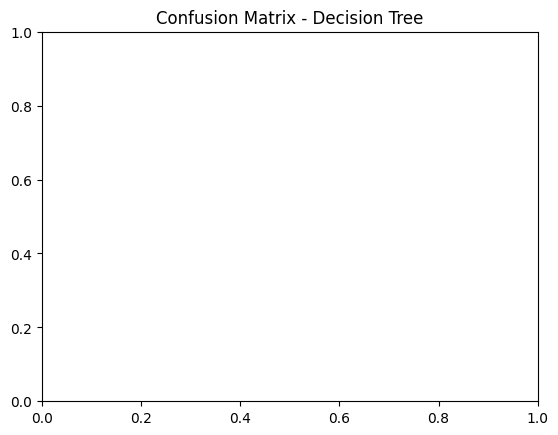

Classification Report - Decision Tree:
               precision    recall  f1-score   support

    Negative       0.52      0.43      0.47      1437
     Neutral       0.67      0.76      0.72      2650
    Positive       0.77      0.75      0.76      4053

    accuracy                           0.70      8140
   macro avg       0.65      0.65      0.65      8140
weighted avg       0.69      0.70      0.69      8140



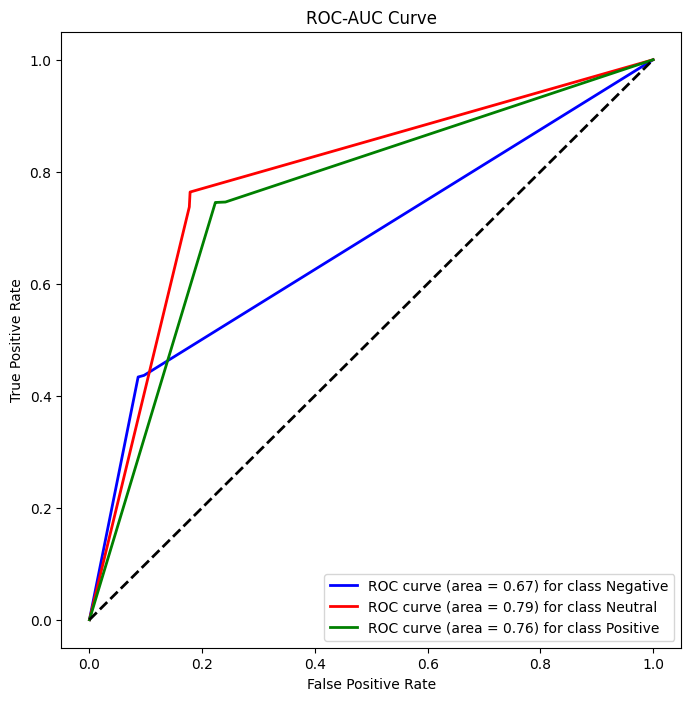

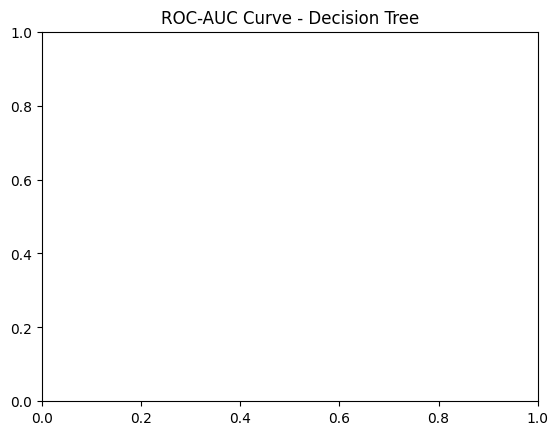

In [ ]:
# Confusion Matrix for Decision Tree
plot_confusion_matrix(y_test, decision_tree_pred, classes=['Negative', 'Neutral', 'Positive'])
plt.title('Confusion Matrix - Decision Tree')
plt.show()

# Classification Report for Decision Tree
print("Classification Report - Decision Tree:\n", classification_report(y_test, decision_tree_pred))

# ROC-AUC Curve for Decision Tree
decision_tree_prob = decision_tree.predict_proba(tfidf_test)
plot_roc_curve(y_test, decision_tree_prob, classes=['Negative', 'Neutral', 'Positive'])
plt.title('ROC-AUC Curve - Decision Tree')
plt.show()


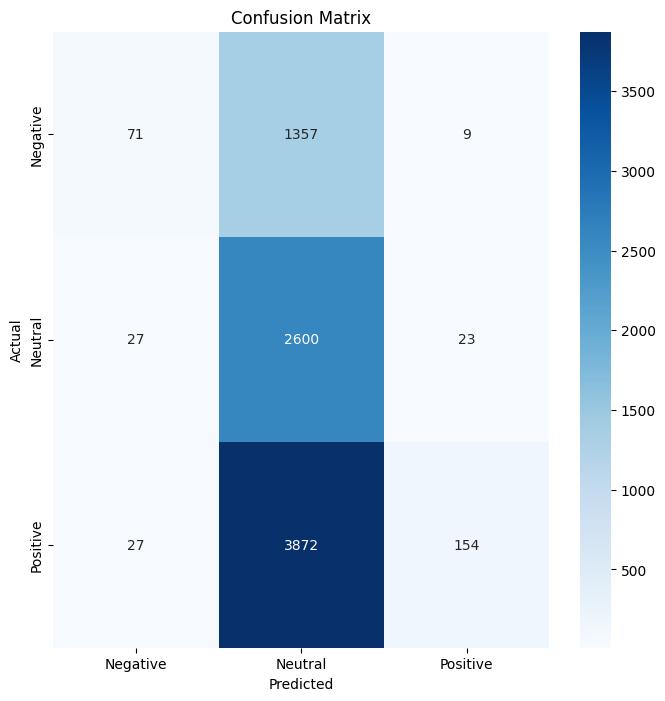

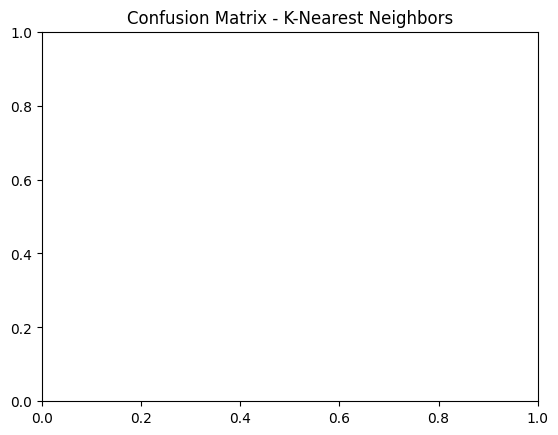

Classification Report - K-Nearest Neighbors:
               precision    recall  f1-score   support

    Negative       0.57      0.05      0.09      1437
     Neutral       0.33      0.98      0.50      2650
    Positive       0.83      0.04      0.07      4053

    accuracy                           0.35      8140
   macro avg       0.58      0.36      0.22      8140
weighted avg       0.62      0.35      0.21      8140



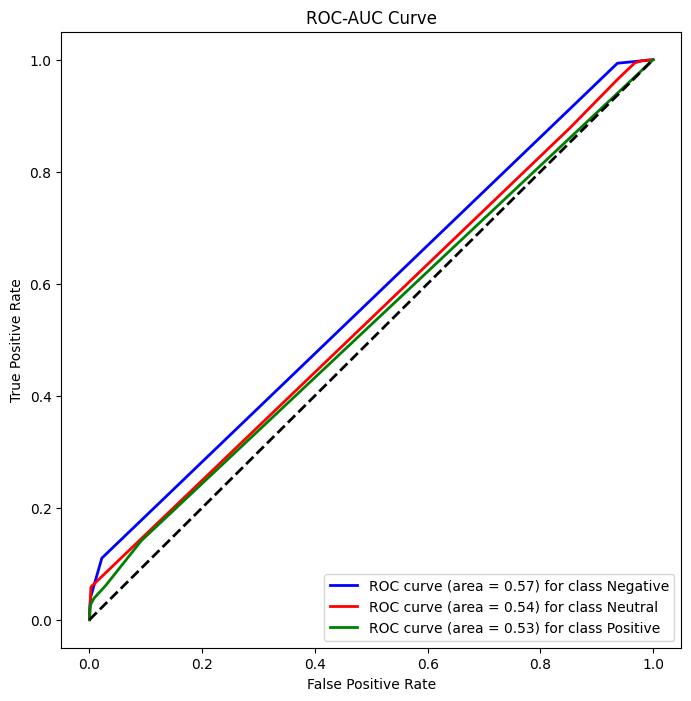

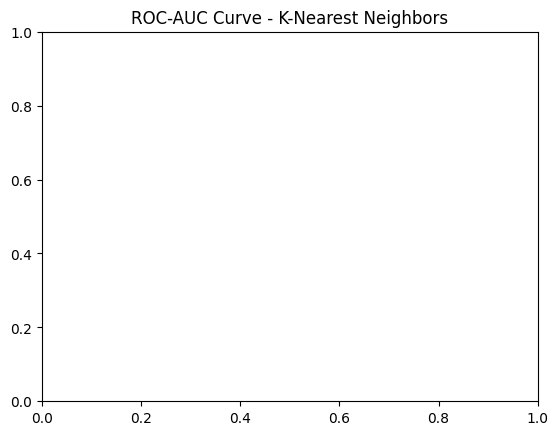

In [ ]:
# Confusion Matrix for K-Nearest Neighbors
plot_confusion_matrix(y_test, knn_pred, classes=['Negative', 'Neutral', 'Positive'])
plt.title('Confusion Matrix - K-Nearest Neighbors')
plt.show()

# Classification Report for K-Nearest Neighbors
print("Classification Report - K-Nearest Neighbors:\n", classification_report(y_test, knn_pred))

# ROC-AUC Curve for K-Nearest Neighbors
knn_prob = knn_classifier.predict_proba(tfidf_test)
plot_roc_curve(y_test, knn_prob, classes=['Negative', 'Neutral', 'Positive'])
plt.title('ROC-AUC Curve - K-Nearest Neighbors')
plt.show()

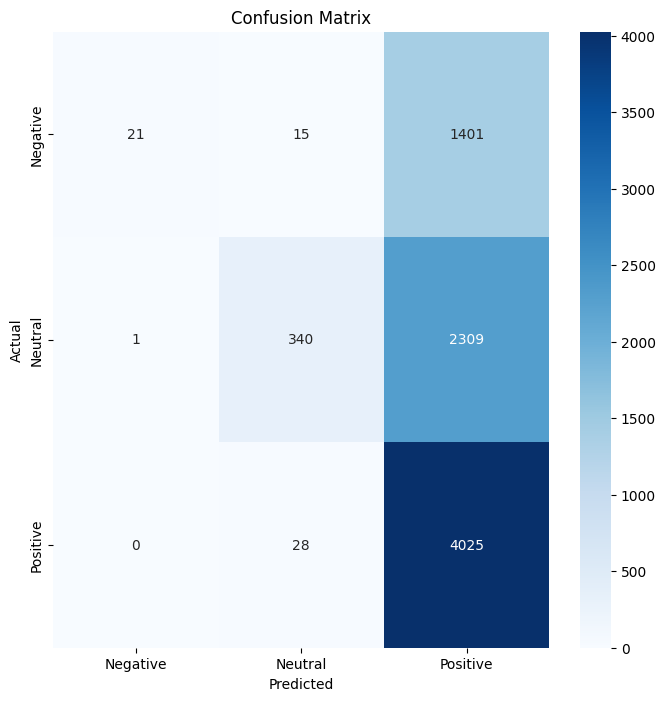

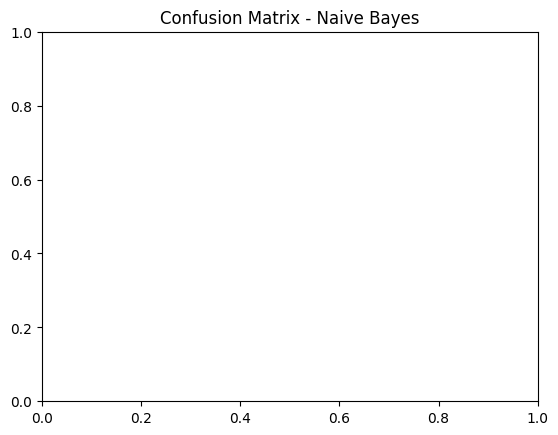

Classification Report - Naive Bayes:
               precision    recall  f1-score   support

    Negative       0.95      0.01      0.03      1437
     Neutral       0.89      0.13      0.22      2650
    Positive       0.52      0.99      0.68      4053

    accuracy                           0.54      8140
   macro avg       0.79      0.38      0.31      8140
weighted avg       0.72      0.54      0.42      8140



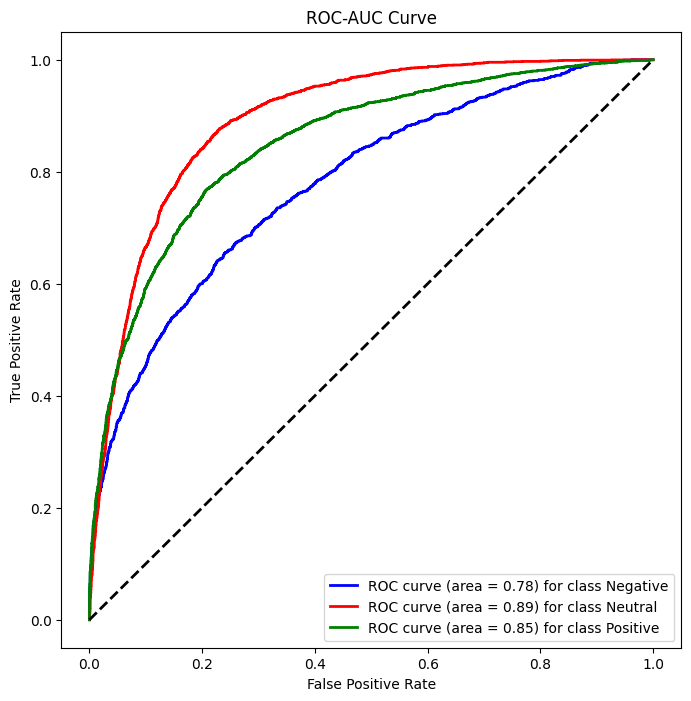

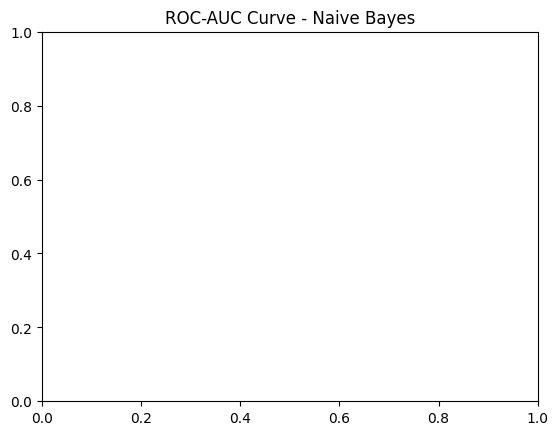

In [ ]:
# Confusion Matrix for Naive Bayes
plot_confusion_matrix(y_test, naive_bayes_pred, classes=['Negative', 'Neutral', 'Positive'])
plt.title('Confusion Matrix - Naive Bayes')
plt.show()

# Classification Report for Naive Bayes
print("Classification Report - Naive Bayes:\n", classification_report(y_test, naive_bayes_pred))

# ROC-AUC Curve for Naive Bayes
naive_bayes_prob = naive_bayes.predict_proba(tfidf_test)
plot_roc_curve(y_test, naive_bayes_prob, classes=['Negative', 'Neutral', 'Positive'])
plt.title('ROC-AUC Curve - Naive Bayes')
plt.show()

In [ ]:
sent_df = df.copy()
sent_df["Sentiment_score"] = ''
sent_df["Negative"] = ''
sent_df["Neutral"] = ''
sent_df["Positive"] = ''
sent_df.head()

,Tweet,Stock Name,Company Name,Tweet Length,Sentiment,Sentiment_score,Z-Score,Negative,Neutral,Positive
Date,,,,,,,,,,
2022-09-29 23:41:16+00:00,Mainstream media has done an amazing job at br...,TSLA,"Tesla, Inc.",288,Positive,,-0.233006,,,
2022-09-29 23:24:43+00:00,Tesla delivery estimates are at around 364k fr...,TSLA,"Tesla, Inc.",68,Neutral,,-0.405396,,,
2022-09-29 23:18:08+00:00,3/ Even if I include 63.0M unvested RSUs as of...,TSLA,"Tesla, Inc.",252,Positive,,0.255584,,,
2022-09-29 22:40:07+00:00,@RealDanODowd @WholeMarsBlog @Tesla Hahaha why...,TSLA,"Tesla, Inc.",212,Positive,,-2.095361,,,
2022-09-29 22:27:05+00:00,"@RealDanODowd @Tesla Stop trying to kill kids,...",TSLA,"Tesla, Inc.",71,Negative,,-2.359307,,,


In [ ]:
tweet = df['Tweet']

In [ ]:
tweet

Date
2022-09-29 23:41:16+00:00    Mainstream media has done an amazing job at br...
2022-09-29 23:24:43+00:00    Tesla delivery estimates are at around 364k fr...
2022-09-29 23:18:08+00:00    3/ Even if I include 63.0M unvested RSUs as of...
2022-09-29 22:40:07+00:00    @RealDanODowd @WholeMarsBlog @Tesla Hahaha why...
2022-09-29 22:27:05+00:00    @RealDanODowd @Tesla Stop trying to kill kids,...
                                                   ...                        
2021-10-07 17:11:57+00:00    Some of the fastest growing tech stocks on the...
2021-10-04 17:05:59+00:00    With earnings on the horizon, here is a quick ...
2021-10-01 04:43:41+00:00    Our record delivery results are a testimony of...
2021-10-01 00:03:32+00:00    We delivered 10,412 Smart EVs in Sep 2021, rea...
2021-09-30 10:22:52+00:00    Why can XPeng P5 deliver outstanding performan...
Name: Tweet, Length: 40699, dtype: object

In [ ]:
sent_df.T

Date,2022-09-29 23:41:16+00:00,2022-09-29 23:24:43+00:00,2022-09-29 23:18:08+00:00,2022-09-29 22:40:07+00:00,2022-09-29 22:27:05+00:00,2022-09-29 22:25:53+00:00,2022-09-29 22:24:22+00:00,2022-09-29 22:23:54+00:00,2022-09-29 22:23:28+00:00,2022-09-29 22:15:01+00:00,...,2021-10-14 05:45:14+00:00,2021-10-13 16:47:19+00:00,2021-10-12 00:49:51+00:00,2021-10-11 03:51:36+00:00,2021-10-09 00:18:25+00:00,2021-10-07 17:11:57+00:00,2021-10-04 17:05:59+00:00,2021-10-01 04:43:41+00:00,2021-10-01 00:03:32+00:00,2021-09-30 10:22:52+00:00
Tweet,Mainstream media has done an amazing job at br...,Tesla delivery estimates are at around 364k fr...,3/ Even if I include 63.0M unvested RSUs as of...,@RealDanODowd @WholeMarsBlog @Tesla Hahaha why...,"@RealDanODowd @Tesla Stop trying to kill kids,...",@RealDanODowd @Tesla This is you https://t.co/...,For years @WholeMarsBlog viciously silenced @T...,$NIO just because I'm down money doesn't mean ...,50 likes for some $SPY $TSLA charts to study!\...,@MrJames__321 @KellyRoofing @TeslaSolar @elonm...,...,🐳 🚨Whale Watchlist🚨🐳\n\n🌊@SharkofTraders Follo...,XPeng P7 tops Sept sales among new EV makers i...,Glocks Watch (1/2)\n\n$F 15.5c &gt; 15.36 | 14...,"NIO reached 100,000 vehicle rolled off the pro...","Update on Apple, Tesla, Nio, $QQQ, $SPY, ROKU,...",Some of the fastest growing tech stocks on the...,"With earnings on the horizon, here is a quick ...",Our record delivery results are a testimony of...,"We delivered 10,412 Smart EVs in Sep 2021, rea...",Why can XPeng P5 deliver outstanding performan...
Stock Name,TSLA,TSLA,TSLA,TSLA,TSLA,TSLA,TSLA,TSLA,TSLA,TSLA,...,XPEV,XPEV,XPEV,XPEV,XPEV,XPEV,XPEV,XPEV,XPEV,XPEV
Company Name,"Tesla, Inc.","Tesla, Inc.","Tesla, Inc.","Tesla, Inc.","Tesla, Inc.","Tesla, Inc.","Tesla, Inc.","Tesla, Inc.","Tesla, Inc.","Tesla, Inc.",...,XPeng Inc.,XPeng Inc.,XPeng Inc.,XPeng Inc.,XPeng Inc.,XPeng Inc.,XPeng Inc.,XPeng Inc.,XPeng Inc.,XPeng Inc.
Tweet Length,288,68,252,212,71,56,300,212,49,170,...,282,150,194,204,280,137,245,225,291,233
Sentiment,Positive,Neutral,Positive,Positive,Negative,Neutral,Negative,Positive,Neutral,Negative,...,Positive,Positive,Positive,Neutral,Neutral,Neutral,Positive,Neutral,Positive,Positive
Sentiment_score,,,,,,,,,,,...,,,,,,,,,,
Z-Score,-0.233006,-0.405396,0.255584,-2.095361,-2.359307,-0.405396,-2.495299,0.152864,0.655968,-2.331394,...,0.305157,0.734794,0.984002,1.042954,0.447179,-0.008138,0.447179,0.53583,0.805582,1.332579
Negative,,,,,,,,,,,...,,,,,,,,,,
Neutral,,,,,,,,,,,...,,,,,,,,,,
Positive,,,,,,,,,,,...,,,,,,,,,,


In [ ]:
%%time


sentiment_analyzer = SentimentIntensityAnalyzer()

for indx, row in sent_df.iterrows():
    try:
        sentence_i = unicodedata.normalize('NFKD', row['Tweet'])
        sentence_sentiment = sentiment_analyzer.polarity_scores(sentence_i)
        sent_df.at[indx, 'Sentiment_score'] = sentence_sentiment['compound']
        sent_df.at[indx, 'Negative'] = sentence_sentiment['neg']
        sent_df.at[indx, 'Neutral'] = sentence_sentiment['neu']
        sent_df.at[indx, 'Positive'] = sentence_sentiment['pos']
    except TypeError:
        print(sent_df.loc[indexx, 'Tweet'])
        print(indx)
        break



CPU times: total: 19.9 s
Wall time: 23.7 s


In [ ]:
sent_df.head()

,Tweet,Stock Name,Company Name,Tweet Length,Sentiment,Sentiment_score,Z-Score,Negative,Neutral,Positive
Date,,,,,,,,,,
2022-09-29 23:41:16+00:00,Mainstream media has done an amazing job at br...,TSLA,"Tesla, Inc.",288,Positive,0.0772,-0.233006,0.125,0.763,0.113
2022-09-29 23:24:43+00:00,Tesla delivery estimates are at around 364k fr...,TSLA,"Tesla, Inc.",68,Neutral,0.0,-0.405396,0.0,1.0,0.0
2022-09-29 23:18:08+00:00,3/ Even if I include 63.0M unvested RSUs as of...,TSLA,"Tesla, Inc.",252,Positive,0.296,0.255584,0.0,0.954,0.046
2022-09-29 22:40:07+00:00,@RealDanODowd @WholeMarsBlog @Tesla Hahaha why...,TSLA,"Tesla, Inc.",212,Positive,-0.7568,-2.095361,0.273,0.59,0.137
2022-09-29 22:27:05+00:00,"@RealDanODowd @Tesla Stop trying to kill kids,...",TSLA,"Tesla, Inc.",71,Negative,-0.875,-2.359307,0.526,0.474,0.0


In [ ]:
mean_sentiment = sent_df['Sentiment_score'].mean()
std_sentiment = sent_df['Sentiment_score'].std()
sent_df['Z-Score'] = (sent_df['Sentiment_score'] - mean_sentiment) / std_sentiment

threshold = 2.0

anomalies = sent_df[sent_df['Z-Score'].abs() > threshold]

print("Sentiment Analysis Results:")
print(sent_df)

print("\nAnomalies:")
print(anomalies)

Sentiment Analysis Results:
                                                                       Tweet  \
Date                                                                           
2022-09-29 23:41:16+00:00  Mainstream media has done an amazing job at br...   
2022-09-29 23:24:43+00:00  Tesla delivery estimates are at around 364k fr...   
2022-09-29 23:18:08+00:00  3/ Even if I include 63.0M unvested RSUs as of...   
2022-09-29 22:40:07+00:00  @RealDanODowd @WholeMarsBlog @Tesla Hahaha why...   
2022-09-29 22:27:05+00:00  @RealDanODowd @Tesla Stop trying to kill kids,...   
...                                                                      ...   
2021-10-07 17:11:57+00:00  Some of the fastest growing tech stocks on the...   
2021-10-04 17:05:59+00:00  With earnings on the horizon, here is a quick ...   
2021-10-01 04:43:41+00:00  Our record delivery results are a testimony of...   
2021-10-01 00:03:32+00:00  We delivered 10,412 Smart EVs in Sep 2021, rea...   
2021-09-30 1

In [ ]:
sent_df.reset_index(inplace=True)

In [ ]:
sent_df.head()

,Date,Tweet,Stock Name,Company Name,Tweet Length,Sentiment,Sentiment_score,Z-Score,Negative,Neutral,Positive
0,2022-09-29 23:41:16+00:00,Mainstream media has done an amazing job at br...,TSLA,"Tesla, Inc.",288,Positive,0.0772,-0.232602,0.125,0.763,0.113
1,2022-09-29 23:24:43+00:00,Tesla delivery estimates are at around 364k fr...,TSLA,"Tesla, Inc.",68,Neutral,0.0,-0.404871,0.0,1.0,0.0
2,2022-09-29 23:18:08+00:00,3/ Even if I include 63.0M unvested RSUs as of...,TSLA,"Tesla, Inc.",252,Positive,0.296,0.255642,0.0,0.954,0.046
3,2022-09-29 22:40:07+00:00,@RealDanODowd @WholeMarsBlog @Tesla Hahaha why...,TSLA,"Tesla, Inc.",212,Positive,-0.7568,-2.093643,0.273,0.59,0.137
4,2022-09-29 22:27:05+00:00,"@RealDanODowd @Tesla Stop trying to kill kids,...",TSLA,"Tesla, Inc.",71,Negative,-0.875,-2.357402,0.526,0.474,0.0


In [ ]:

sent_df['Date'] = pd.to_datetime(sent_df['Date'])
print(sent_df.head())
sent_df['Date'] = sent_df['Date'].dt.date
print(sent_df['Date'].head())


                       Date  \
0 2022-09-29 23:41:16+00:00   
1 2022-09-29 23:24:43+00:00   
2 2022-09-29 23:18:08+00:00   
3 2022-09-29 22:40:07+00:00   
4 2022-09-29 22:27:05+00:00   

                                               Tweet Stock Name Company Name  \
0  Mainstream media has done an amazing job at br...       TSLA  Tesla, Inc.   
1  Tesla delivery estimates are at around 364k fr...       TSLA  Tesla, Inc.   
2  3/ Even if I include 63.0M unvested RSUs as of...       TSLA  Tesla, Inc.   
3  @RealDanODowd @WholeMarsBlog @Tesla Hahaha why...       TSLA  Tesla, Inc.   
4  @RealDanODowd @Tesla Stop trying to kill kids,...       TSLA  Tesla, Inc.   

   Tweet Length Sentiment Sentiment_score   Z-Score Negative Neutral Positive  
0           288  Positive          0.0772 -0.232602    0.125   0.763    0.113  
1            68   Neutral             0.0 -0.404871      0.0     1.0      0.0  
2           252  Positive           0.296  0.255642      0.0   0.954    0.046  
3           

In [ ]:
sent_df.dtypes

Date               object
Tweet              object
Stock Name         object
Company Name       object
Tweet Length        int64
Sentiment          object
Sentiment_score    object
Z-Score            object
Negative           object
Neutral            object
Positive           object
dtype: object

In [ ]:
twit_df = sent_df.copy()
twit_df.head()

,Date,Tweet,Stock Name,Company Name,Tweet Length,Sentiment,Sentiment_score,Z-Score,Negative,Neutral,Positive
0,2022-09-29,Mainstream media has done an amazing job at br...,TSLA,"Tesla, Inc.",288,Positive,0.0772,-0.232602,0.125,0.763,0.113
1,2022-09-29,Tesla delivery estimates are at around 364k fr...,TSLA,"Tesla, Inc.",68,Neutral,0.0,-0.404871,0.0,1.0,0.0
2,2022-09-29,3/ Even if I include 63.0M unvested RSUs as of...,TSLA,"Tesla, Inc.",252,Positive,0.296,0.255642,0.0,0.954,0.046
3,2022-09-29,@RealDanODowd @WholeMarsBlog @Tesla Hahaha why...,TSLA,"Tesla, Inc.",212,Positive,-0.7568,-2.093643,0.273,0.59,0.137
4,2022-09-29,"@RealDanODowd @Tesla Stop trying to kill kids,...",TSLA,"Tesla, Inc.",71,Negative,-0.875,-2.357402,0.526,0.474,0.0


In [ ]:
twit_df = twit_df[['Date','Tweet','Sentiment_score']]

In [ ]:
twit_df.head()

,Date,Tweet,Sentiment_score
0,2022-09-29,Mainstream media has done an amazing job at br...,0.0772
1,2022-09-29,Tesla delivery estimates are at around 364k fr...,0.0
2,2022-09-29,3/ Even if I include 63.0M unvested RSUs as of...,0.296
3,2022-09-29,@RealDanODowd @WholeMarsBlog @Tesla Hahaha why...,-0.7568
4,2022-09-29,"@RealDanODowd @Tesla Stop trying to kill kids,...",-0.875


In [ ]:
twit_df.shape

(40699, 3)

In [ ]:
twit_df.dtypes

Date               object
Tweet              object
Sentiment_score    object
dtype: object

In [ ]:
twitt_df = twit_df.groupby('Date')['Sentiment_score'].mean()


In [ ]:
pd.DataFrame(twitt_df)

,Sentiment_score
Date,
2021-09-30,0.270254
2021-10-01,0.239076
2021-10-02,0.310408
2021-10-03,0.280824
2021-10-04,0.147932
...,...
2022-09-25,0.143565
2022-09-26,0.120966
2022-09-27,0.219417


Step 3: Stock Data Integration and Visualization

In [ ]:
stocks = pd.read_csv('./tweet data/automobile_stocks.csv')

In [ ]:
stocks.head()

,Date,Open,High,Low,Close,Adj Close,Volume,Stock Name
0,2022-10-26,219.399994,230.600006,218.199997,224.639999,224.639999,85012500,TSLA
1,2022-10-27,229.770004,233.809998,222.850006,225.089996,225.089996,61638800,TSLA
2,2022-10-28,225.399994,228.860001,216.350006,228.520004,228.520004,69152400,TSLA
3,2022-10-31,226.190002,229.850006,221.940002,227.539993,227.539993,61554300,TSLA
4,2022-11-01,234.050003,237.399994,227.279999,227.820007,227.820007,62688800,TSLA


In [ ]:
stocks.shape

(4723, 8)

In [ ]:
df.shape

(40699, 7)

In [ ]:
stocks['Stock Name'].value_counts()

Stock Name
TSLA    3463
MSFT     252
NFLX     252
F        252
NIO      252
XPEV     252
Name: count, dtype: int64

In [ ]:
stock_name = ['TSLA','NIO','XPEV','F']

In [ ]:
stock_names_to_select = ['TSLA', 'NIO', 'XPEV', 'F']


selected_rows = stocks[stocks['Stock Name'].isin(stock_names_to_select)]

In [ ]:
stock_df = selected_rows

In [ ]:
stock_df.shape

(4219, 8)

In [ ]:
stock_df.head()

,Date,Open,High,Low,Close,Adj Close,Volume,Stock Name
0,2022-10-26,219.399994,230.600006,218.199997,224.639999,224.639999,85012500,TSLA
1,2022-10-27,229.770004,233.809998,222.850006,225.089996,225.089996,61638800,TSLA
2,2022-10-28,225.399994,228.860001,216.350006,228.520004,228.520004,69152400,TSLA
3,2022-10-31,226.190002,229.850006,221.940002,227.539993,227.539993,61554300,TSLA
4,2022-11-01,234.050003,237.399994,227.279999,227.820007,227.820007,62688800,TSLA


In [ ]:
stock_df.dtypes

Date           object
Open          float64
High          float64
Low           float64
Close         float64
Adj Close     float64
Volume          int64
Stock Name     object
dtype: object

In [ ]:
final_df = stock_df.merge(twitt_df, on='Date', how='left')
final_df.head()

,Date,Open,High,Low,Close,Adj Close,Volume,Stock Name,Sentiment_score
0,2022-10-26,219.399994,230.600006,218.199997,224.639999,224.639999,85012500,TSLA,NaN
1,2022-10-27,229.770004,233.809998,222.850006,225.089996,225.089996,61638800,TSLA,NaN
2,2022-10-28,225.399994,228.860001,216.350006,228.520004,228.520004,69152400,TSLA,NaN
3,2022-10-31,226.190002,229.850006,221.940002,227.539993,227.539993,61554300,TSLA,NaN
4,2022-11-01,234.050003,237.399994,227.279999,227.820007,227.820007,62688800,TSLA,NaN


In [ ]:
final_df = final_df.drop(columns=['Stock Name'])

In [ ]:
final_df.head()

,Date,Open,High,Low,Close,Adj Close,Volume,Sentiment_score
0,2022-10-26,219.399994,230.600006,218.199997,224.639999,224.639999,85012500,NaN
1,2022-10-27,229.770004,233.809998,222.850006,225.089996,225.089996,61638800,NaN
2,2022-10-28,225.399994,228.860001,216.350006,228.520004,228.520004,69152400,NaN
3,2022-10-31,226.190002,229.850006,221.940002,227.539993,227.539993,61554300,NaN
4,2022-11-01,234.050003,237.399994,227.279999,227.820007,227.820007,62688800,NaN


In [ ]:
df.reset_index(inplace=True)

In [ ]:
df.head()

,Date,Tweet,Stock Name,Company Name,Tweet Length,Sentiment,Sentiment_score,Z-Score
0,2022-09-29 23:41:16+00:00,Mainstream media has done an amazing job at br...,TSLA,"Tesla, Inc.",288,Positive,0.0772,-0.233006
1,2022-09-29 23:24:43+00:00,Tesla delivery estimates are at around 364k fr...,TSLA,"Tesla, Inc.",68,Neutral,0.0000,-0.405396
2,2022-09-29 23:18:08+00:00,3/ Even if I include 63.0M unvested RSUs as of...,TSLA,"Tesla, Inc.",252,Positive,0.2960,0.255584
3,2022-09-29 22:40:07+00:00,@RealDanODowd @WholeMarsBlog @Tesla Hahaha why...,TSLA,"Tesla, Inc.",212,Positive,-0.7568,-2.095361
4,2022-09-29 22:27:05+00:00,"@RealDanODowd @Tesla Stop trying to kill kids,...",TSLA,"Tesla, Inc.",71,Negative,-0.8750,-2.359307


In [ ]:
df['Date'] = pd.to_datetime(df['Date'])
stock_df['Date'] = pd.to_datetime(stock_df['Date'])



In [ ]:
df.head()

,Date,Tweet,Stock Name,Company Name,Tweet Length,Sentiment,Sentiment_score,Z-Score
0,2022-09-29 23:41:16+00:00,Mainstream media has done an amazing job at br...,TSLA,"Tesla, Inc.",288,Positive,0.0772,-0.233006
1,2022-09-29 23:24:43+00:00,Tesla delivery estimates are at around 364k fr...,TSLA,"Tesla, Inc.",68,Neutral,0.0000,-0.405396
2,2022-09-29 23:18:08+00:00,3/ Even if I include 63.0M unvested RSUs as of...,TSLA,"Tesla, Inc.",252,Positive,0.2960,0.255584
3,2022-09-29 22:40:07+00:00,@RealDanODowd @WholeMarsBlog @Tesla Hahaha why...,TSLA,"Tesla, Inc.",212,Positive,-0.7568,-2.095361
4,2022-09-29 22:27:05+00:00,"@RealDanODowd @Tesla Stop trying to kill kids,...",TSLA,"Tesla, Inc.",71,Negative,-0.8750,-2.359307


In [ ]:
#adding techinacal indicators

def get_tech_ind(data):
    data['MA7'] = data.iloc[:,4].rolling(window=7).mean()
    data['MA20'] = data.iloc[:,4].rolling(window=20).mean()

    data['MACD'] = data.iloc[:,4].ewm(span=26).mean() - data.iloc[:,1].ewm(span=12,adjust=False).mean()
    #This is the difference of Closing price and Opening Price

    # Create Bollinger Bands
    data['20SD'] = data.iloc[:, 4].rolling(20).std()
    data['upper_band'] = data['MA20'] + (data['20SD'] * 2)
    data['lower_band'] = data['MA20'] - (data['20SD'] * 2)

    # Create Exponential moving average
    data['EMA'] = data.iloc[:,4].ewm(com=0.5).mean()

    # Create LogMomentum
    data['logmomentum'] = np.log(data.iloc[:,4] - 1)

    return data

In [ ]:

tech_df = get_tech_ind(final_df)
dataset = tech_df.iloc[20:,:].reset_index(drop=True)
dataset.head()

,Date,Open,High,Low,Close,Adj Close,Volume,Sentiment_score,MA7,MA20,MACD,20SD,upper_band,lower_band,EMA,logmomentum
0,2022-11-23,173.570007,183.619995,172.500000,183.199997,183.199997,109536700,NaN,180.811427,197.800999,4.544874,19.549892,236.900783,158.701216,179.060925,5.205105
1,2022-11-25,185.059998,185.199997,180.630005,182.860001,182.860001,50672700,NaN,179.159999,195.689500,4.042516,18.709894,233.109288,158.269711,181.593642,5.203237
2,2022-11-28,179.960007,188.500000,179.000000,182.919998,182.919998,92905200,NaN,178.588571,193.409499,4.370326,17.217483,227.844466,158.974533,182.477879,5.203567
3,2022-11-29,184.990005,186.380005,178.750000,180.830002,180.830002,83357100,NaN,178.254286,191.074000,3.655247,15.418128,221.910256,160.237744,181.379294,5.192012
4,2022-11-30,182.429993,194.759995,180.630005,194.699997,194.699997,109186400,NaN,180.327142,189.417999,4.604523,12.824087,215.066173,163.769826,190.259763,5.266311


In [ ]:
dataset.shape

(4199, 16)

In [ ]:
tech_df

,Date,Open,High,Low,Close,Adj Close,Volume,Sentiment_score,MA7,MA20,MACD,20SD,upper_band,lower_band,EMA,logmomentum
0,2022-10-26,219.399994,230.600006,218.199997,224.639999,224.639999,85012500,NaN,NaN,NaN,5.240005,NaN,NaN,NaN,224.639999,5.410038
1,2022-10-27,229.770004,233.809998,222.850006,225.089996,225.089996,61638800,NaN,NaN,NaN,3.878271,NaN,NaN,NaN,224.977497,5.412048
2,2022-10-28,225.399994,228.860001,216.350006,228.520004,228.520004,69152400,NaN,NaN,NaN,4.510737,NaN,NaN,NaN,227.430002,5.427238
3,2022-10-31,226.190002,229.850006,221.940002,227.539993,227.539993,61554300,NaN,NaN,NaN,4.194962,NaN,NaN,NaN,227.504246,5.422921
4,2022-11-01,234.050003,237.399994,227.279999,227.820007,227.820007,62688800,NaN,NaN,NaN,2.689250,NaN,NaN,NaN,227.715623,5.424157
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4214,2022-03-18,874.489990,907.849976,867.390015,905.390015,905.390015,33408500,NaN,831.304278,832.626996,24.683688,37.610199,907.847395,757.406597,888.964587,6.807261
4215,2022-03-21,914.979980,942.849976,907.090027,921.159973,921.159973,27327200,NaN,843.141419,835.835996,16.712846,42.249311,920.334618,751.337373,910.428178,6.824548
4216,2022-03-22,930.000000,997.859985,921.750000,993.979980,993.979980,35289500,NaN,871.517133,844.458493,13.431154,54.884084,954.226662,734.690325,966.129379,6.900711
4217,2022-03-23,979.940002,1040.699951,976.400024,999.109985,999.109985,40225400,NaN,904.765703,856.211993,4.133006,61.524510,979.261014,733.162973,988.116450,6.905863


In [ ]:
dataset.iloc[:, 1:] = pd.concat([dataset.iloc[:, 1:].ffill()])

In [ ]:
dataset

,Date,Open,High,Low,Close,Adj Close,Volume,Sentiment_score,MA7,MA20,MACD,20SD,upper_band,lower_band,EMA,logmomentum
0,2022-11-23,173.570007,183.619995,172.500000,183.199997,183.199997,109536700,NaN,180.811427,197.800999,4.544874,19.549892,236.900783,158.701216,179.060925,5.205105
1,2022-11-25,185.059998,185.199997,180.630005,182.860001,182.860001,50672700,NaN,179.159999,195.689500,4.042516,18.709894,233.109288,158.269711,181.593642,5.203237
2,2022-11-28,179.960007,188.500000,179.000000,182.919998,182.919998,92905200,NaN,178.588571,193.409499,4.370326,17.217483,227.844466,158.974533,182.477879,5.203567
3,2022-11-29,184.990005,186.380005,178.750000,180.830002,180.830002,83357100,NaN,178.254286,191.074000,3.655247,15.418128,221.910256,160.237744,181.379294,5.192012
4,2022-11-30,182.429993,194.759995,180.630005,194.699997,194.699997,109186400,NaN,180.327142,189.417999,4.604523,12.824087,215.066173,163.769826,190.259763,5.266311
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4194,2022-03-18,874.489990,907.849976,867.390015,905.390015,905.390015,33408500,NaN,831.304278,832.626996,24.683688,37.610199,907.847395,757.406597,888.964587,6.807261
4195,2022-03-21,914.979980,942.849976,907.090027,921.159973,921.159973,27327200,NaN,843.141419,835.835996,16.712846,42.249311,920.334618,751.337373,910.428178,6.824548
4196,2022-03-22,930.000000,997.859985,921.750000,993.979980,993.979980,35289500,NaN,871.517133,844.458493,13.431154,54.884084,954.226662,734.690325,966.129379,6.900711
4197,2022-03-23,979.940002,1040.699951,976.400024,999.109985,999.109985,40225400,NaN,904.765703,856.211993,4.133006,61.524510,979.261014,733.162973,988.116450,6.905863


In [ ]:
datetime_series = pd.to_datetime(dataset['Date'])
datetime_index = pd.DatetimeIndex(datetime_series.values)


In [ ]:
dataset

,Date,Open,High,Low,Close,Adj Close,Volume,Sentiment_score,MA7,MA20,MACD,20SD,upper_band,lower_band,EMA,logmomentum
0,2022-11-23,173.570007,183.619995,172.500000,183.199997,183.199997,109536700,NaN,180.811427,197.800999,4.544874,19.549892,236.900783,158.701216,179.060925,5.205105
1,2022-11-25,185.059998,185.199997,180.630005,182.860001,182.860001,50672700,NaN,179.159999,195.689500,4.042516,18.709894,233.109288,158.269711,181.593642,5.203237
2,2022-11-28,179.960007,188.500000,179.000000,182.919998,182.919998,92905200,NaN,178.588571,193.409499,4.370326,17.217483,227.844466,158.974533,182.477879,5.203567
3,2022-11-29,184.990005,186.380005,178.750000,180.830002,180.830002,83357100,NaN,178.254286,191.074000,3.655247,15.418128,221.910256,160.237744,181.379294,5.192012
4,2022-11-30,182.429993,194.759995,180.630005,194.699997,194.699997,109186400,NaN,180.327142,189.417999,4.604523,12.824087,215.066173,163.769826,190.259763,5.266311
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4194,2022-03-18,874.489990,907.849976,867.390015,905.390015,905.390015,33408500,NaN,831.304278,832.626996,24.683688,37.610199,907.847395,757.406597,888.964587,6.807261
4195,2022-03-21,914.979980,942.849976,907.090027,921.159973,921.159973,27327200,NaN,843.141419,835.835996,16.712846,42.249311,920.334618,751.337373,910.428178,6.824548
4196,2022-03-22,930.000000,997.859985,921.750000,993.979980,993.979980,35289500,NaN,871.517133,844.458493,13.431154,54.884084,954.226662,734.690325,966.129379,6.900711
4197,2022-03-23,979.940002,1040.699951,976.400024,999.109985,999.109985,40225400,NaN,904.765703,856.211993,4.133006,61.524510,979.261014,733.162973,988.116450,6.905863


In [ ]:
df.shape

(40699, 8)

In [ ]:
stock_df.shape

(4219, 8)

In [ ]:
df['Date'] = df['Date'].dt.date

In [ ]:
df.head()

,Date,Tweet,Stock Name,Company Name,Tweet Length,Sentiment,Sentiment_score,Z-Score
0,2022-09-29,Mainstream media has done an amazing job at br...,TSLA,"Tesla, Inc.",288,Positive,0.0772,-0.233006
1,2022-09-29,Tesla delivery estimates are at around 364k fr...,TSLA,"Tesla, Inc.",68,Neutral,0.0000,-0.405396
2,2022-09-29,3/ Even if I include 63.0M unvested RSUs as of...,TSLA,"Tesla, Inc.",252,Positive,0.2960,0.255584
3,2022-09-29,@RealDanODowd @WholeMarsBlog @Tesla Hahaha why...,TSLA,"Tesla, Inc.",212,Positive,-0.7568,-2.095361
4,2022-09-29,"@RealDanODowd @Tesla Stop trying to kill kids,...",TSLA,"Tesla, Inc.",71,Negative,-0.8750,-2.359307


In [ ]:
stock_df.columns

Index(['Date', 'Open', 'High', 'Low', 'Close', 'Adj Close', 'Volume',
       'Stock Name'],
      dtype='object')

In [ ]:
stock_df

,Date,Open,High,Low,Close,Adj Close,Volume,Stock Name
0,2022-10-26,219.399994,230.600006,218.199997,224.639999,224.639999,85012500,TSLA
1,2022-10-27,229.770004,233.809998,222.850006,225.089996,225.089996,61638800,TSLA
2,2022-10-28,225.399994,228.860001,216.350006,228.520004,228.520004,69152400,TSLA
3,2022-10-31,226.190002,229.850006,221.940002,227.539993,227.539993,61554300,TSLA
4,2022-11-01,234.050003,237.399994,227.279999,227.820007,227.820007,62688800,TSLA
...,...,...,...,...,...,...,...,...
4718,2022-03-18,874.489990,907.849976,867.390015,905.390015,905.390015,33408500,TSLA
4719,2022-03-21,914.979980,942.849976,907.090027,921.159973,921.159973,27327200,TSLA
4720,2022-03-22,930.000000,997.859985,921.750000,993.979980,993.979980,35289500,TSLA
4721,2022-03-23,979.940002,1040.699951,976.400024,999.109985,999.109985,40225400,TSLA


In [ ]:
stock_df['Stock Name'].value_counts()

Stock Name
TSLA    3463
F        252
NIO      252
XPEV     252
Name: count, dtype: int64

In [ ]:
stocks['Date']

0       2022-10-26
1       2022-10-27
2       2022-10-28
3       2022-10-31
4       2022-11-01
           ...    
4718    2022-03-18
4719    2022-03-21
4720    2022-03-22
4721    2022-03-23
4722    2022-03-24
Name: Date, Length: 4723, dtype: object

In [ ]:
stocks['Date'] = pd.to_datetime(stocks['Date'])
df['Date'] = pd.to_datetime(df['Date'])

In [ ]:
df

,Date,Tweet,Stock Name,Company Name,Tweet Length,Sentiment,Sentiment_score,Z-Score
0,2022-09-29,Mainstream media has done an amazing job at br...,TSLA,"Tesla, Inc.",288,Positive,0.0772,-0.233006
1,2022-09-29,Tesla delivery estimates are at around 364k fr...,TSLA,"Tesla, Inc.",68,Neutral,0.0000,-0.405396
2,2022-09-29,3/ Even if I include 63.0M unvested RSUs as of...,TSLA,"Tesla, Inc.",252,Positive,0.2960,0.255584
3,2022-09-29,@RealDanODowd @WholeMarsBlog @Tesla Hahaha why...,TSLA,"Tesla, Inc.",212,Positive,-0.7568,-2.095361
4,2022-09-29,"@RealDanODowd @Tesla Stop trying to kill kids,...",TSLA,"Tesla, Inc.",71,Negative,-0.8750,-2.359307
...,...,...,...,...,...,...,...,...
40694,2021-10-07,Some of the fastest growing tech stocks on the...,XPEV,XPeng Inc.,137,Neutral,0.1779,-0.008138
40695,2021-10-04,"With earnings on the horizon, here is a quick ...",XPEV,XPeng Inc.,245,Positive,0.3818,0.447179
40696,2021-10-01,Our record delivery results are a testimony of...,XPEV,XPeng Inc.,225,Neutral,0.4215,0.535830
40697,2021-10-01,"We delivered 10,412 Smart EVs in Sep 2021, rea...",XPEV,XPeng Inc.,291,Positive,0.5423,0.805582


In [ ]:
merged_df = pd.merge(stocks, df, on=['Date', 'Stock Name'], how='inner')
merged_df.head()

,Date,Open,High,Low,Close,Adj Close,Volume,Stock Name,Tweet,Company Name,Tweet Length,Sentiment,Sentiment_score,Z-Score
0,2021-09-30,260.333344,263.043335,258.333344,258.493347,258.493347,53868000,TSLA,#LottoFriday Watchlist: short &amp; sweet\n\n$...,"Tesla, Inc.",240,Positive,0.8478,1.487776
1,2021-09-30,260.333344,263.043335,258.333344,258.493347,258.493347,53868000,TSLA,CORRECTION UPDATE\n\nUPDATE on Q3 Delivery Est...,"Tesla, Inc.",296,Neutral,-0.1531,-0.747275
2,2021-09-30,260.333344,263.043335,258.333344,258.493347,258.493347,53868000,TSLA,FREE #OPTIONS Ideas 🤯\n\nScale out when above ...,"Tesla, Inc.",317,Positive,0.9083,1.622875
3,2021-09-30,260.333344,263.043335,258.333344,258.493347,258.493347,53868000,TSLA,California DMV today issued autonomous vehicle...,"Tesla, Inc.",272,Positive,0.0000,-0.405396
4,2021-09-30,260.333344,263.043335,258.333344,258.493347,258.493347,53868000,TSLA,@chamath Appreciate the clarification @chamath...,"Tesla, Inc.",196,Positive,0.4019,0.492063


In [ ]:
max(stocks['Date']),max(df['Date'])

(Timestamp('2023-10-27 00:00:00'), Timestamp('2022-09-29 00:00:00'))

In [ ]:
merged_df.isnull().sum()

Date               0
Open               0
High               0
Low                0
Close              0
Adj Close          0
Volume             0
Stock Name         0
Tweet              0
Company Name       0
Tweet Length       0
Sentiment          0
Sentiment_score    0
Z-Score            0
dtype: int64

In [ ]:
merged_df.duplicated().sum()

13

In [ ]:
merged_df.drop_duplicates(inplace=True)

In [ ]:
merged_df.head()

,Date,Open,High,Low,Close,Adj Close,Volume,Stock Name,Tweet,Company Name,Tweet Length,Sentiment,Sentiment_score,Z-Score
0,2021-09-30,260.333344,263.043335,258.333344,258.493347,258.493347,53868000,TSLA,#LottoFriday Watchlist: short &amp; sweet\n\n$...,"Tesla, Inc.",240,Positive,0.8478,1.487776
1,2021-09-30,260.333344,263.043335,258.333344,258.493347,258.493347,53868000,TSLA,CORRECTION UPDATE\n\nUPDATE on Q3 Delivery Est...,"Tesla, Inc.",296,Neutral,-0.1531,-0.747275
2,2021-09-30,260.333344,263.043335,258.333344,258.493347,258.493347,53868000,TSLA,FREE #OPTIONS Ideas 🤯\n\nScale out when above ...,"Tesla, Inc.",317,Positive,0.9083,1.622875
3,2021-09-30,260.333344,263.043335,258.333344,258.493347,258.493347,53868000,TSLA,California DMV today issued autonomous vehicle...,"Tesla, Inc.",272,Positive,0.0000,-0.405396
4,2021-09-30,260.333344,263.043335,258.333344,258.493347,258.493347,53868000,TSLA,@chamath Appreciate the clarification @chamath...,"Tesla, Inc.",196,Positive,0.4019,0.492063


 Plot for Stock Price Momentum based on Tweet Sentiment:

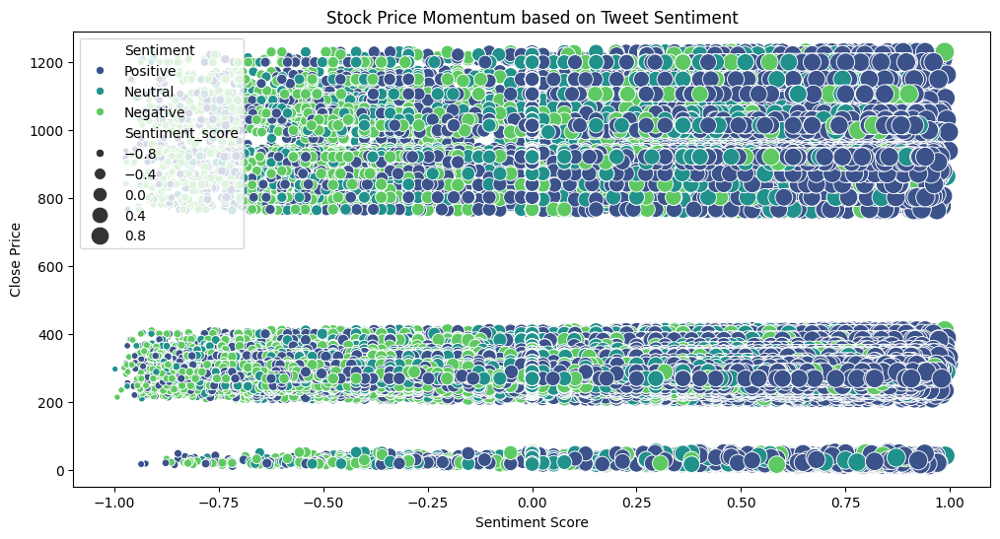

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(12, 6))
sns.scatterplot(x='Sentiment_score', y='Close', hue='Sentiment', data=merged_df, palette='viridis', size='Sentiment_score', sizes=(20, 200))
plt.title('Stock Price Momentum based on Tweet Sentiment')
plt.xlabel('Sentiment Score')
plt.ylabel('Close Price')
plt.legend()
plt.show()


Distribution of Sentiment Scores:

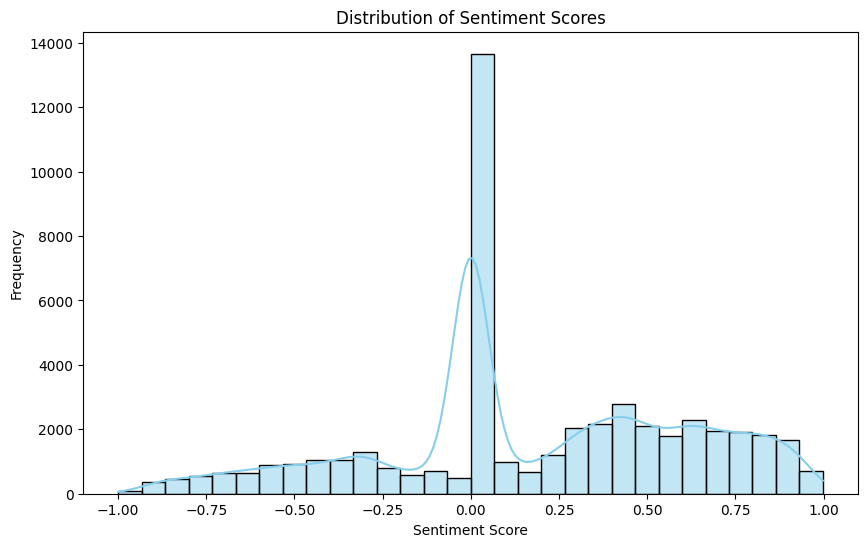

In [ ]:
plt.figure(figsize=(10, 6))
sns.histplot(merged_df['Sentiment_score'], bins=30, kde=True, color='skyblue')
plt.title('Distribution of Sentiment Scores')
plt.xlabel('Sentiment Score')
plt.ylabel('Frequency')
plt.show()

Sentiment Distribution Over Time:

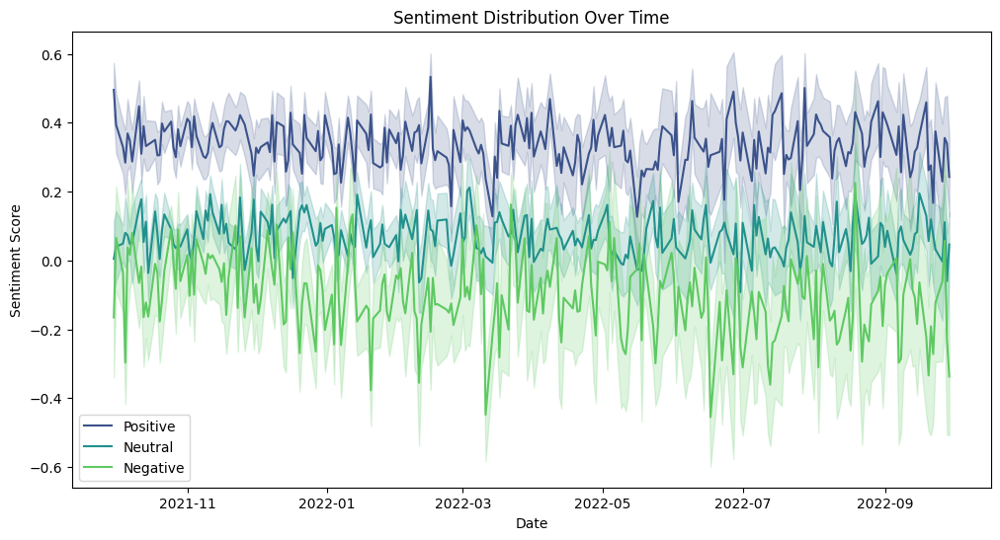

In [ ]:
plt.figure(figsize=(12, 6))
sns.lineplot(x='Date', y='Sentiment_score', hue='Sentiment', data= merged_df, palette='viridis')
plt.title('Sentiment Distribution Over Time')
plt.xlabel('Date')
plt.ylabel('Sentiment Score')
plt.legend()
plt.show()


Correlation Between Sentiment and Stock Price:

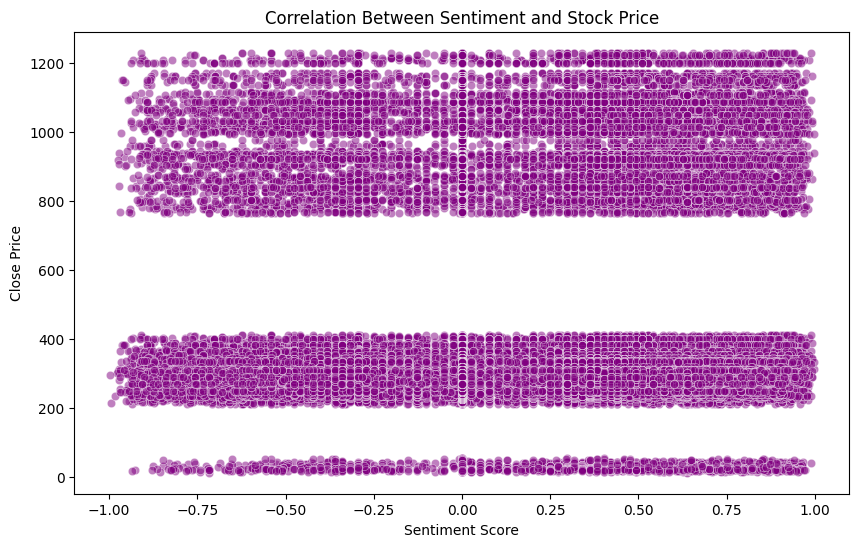

In [ ]:
plt.figure(figsize=(10, 6))
sns.scatterplot(x='Sentiment_score', y='Close', data=merged_df, color='purple', alpha=0.5)
plt.title('Correlation Between Sentiment and Stock Price')
plt.xlabel('Sentiment Score')
plt.ylabel('Close Price')
plt.show()


In [ ]:
merged_df.to_csv('./tweet data/merged_df.csv', index=False)

 Anomaly Detection and Time Series Forecasting

In [ ]:
stock = pd.read_csv('./tweet data/merged_df.csv')

In [ ]:
stock.head()

,Date,Open,High,Low,Close,Adj Close,Volume,Stock Name,Tweet,Company Name,Tweet Length,Sentiment,Sentiment_score,Z-Score
0,2021-09-30,260.333344,263.043335,258.333344,258.493347,258.493347,53868000,TSLA,#LottoFriday Watchlist: short &amp; sweet\n\n$...,"Tesla, Inc.",240,Positive,0.8478,1.487776
1,2021-09-30,260.333344,263.043335,258.333344,258.493347,258.493347,53868000,TSLA,CORRECTION UPDATE\n\nUPDATE on Q3 Delivery Est...,"Tesla, Inc.",296,Neutral,-0.1531,-0.747275
2,2021-09-30,260.333344,263.043335,258.333344,258.493347,258.493347,53868000,TSLA,FREE #OPTIONS Ideas 🤯\n\nScale out when above ...,"Tesla, Inc.",317,Positive,0.9083,1.622875
3,2021-09-30,260.333344,263.043335,258.333344,258.493347,258.493347,53868000,TSLA,California DMV today issued autonomous vehicle...,"Tesla, Inc.",272,Positive,0.0000,-0.405396
4,2021-09-30,260.333344,263.043335,258.333344,258.493347,258.493347,53868000,TSLA,@chamath Appreciate the clarification @chamath...,"Tesla, Inc.",196,Positive,0.4019,0.492063


In [ ]:
stock['Stock Name'].value_counts()

Stock Name
TSLA    45823
NIO      2281
XPEV      170
F          26
Name: count, dtype: int64

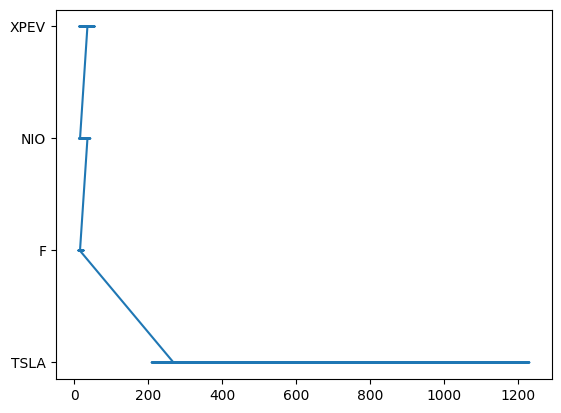

In [ ]:
plt.plot(stock['Close'],stock['Stock Name'])

In [ ]:
ano_df = pd.DataFrame(stock[['Date','Close','Stock Name']])

In [ ]:
ano_df


,Date,Close,Stock Name
0,2021-09-30,258.493347,TSLA
1,2021-09-30,258.493347,TSLA
2,2021-09-30,258.493347,TSLA
3,2021-09-30,258.493347,TSLA
4,2021-09-30,258.493347,TSLA
...,...,...,...
48295,2022-08-30,18.260000,XPEV
48296,2022-09-07,16.000000,XPEV
48297,2022-09-12,16.360001,XPEV
48298,2022-09-19,15.640000,XPEV


In [ ]:
ano_df.value_counts()

Date        Close        Stock Name
2021-10-25  341.619995   TSLA          462
            1024.859985  TSLA          462
2022-04-20  325.733337   TSLA          350
2022-01-26  312.470001   TSLA          314
            937.409973   TSLA          314
                                      ... 
2022-04-21  23.840000    XPEV            1
2022-04-12  15.360000    F               1
2021-10-26  45.340000    XPEV            1
2021-10-27  45.900002    XPEV            1
2021-09-30  35.540001    XPEV            1
Name: count, Length: 743, dtype: int64

In [ ]:
ano_df

,Date,Close,Stock Name
0,2021-09-30,258.493347,TSLA
1,2021-09-30,258.493347,TSLA
2,2021-09-30,258.493347,TSLA
3,2021-09-30,258.493347,TSLA
4,2021-09-30,258.493347,TSLA
...,...,...,...
48295,2022-08-30,18.260000,XPEV
48296,2022-09-07,16.000000,XPEV
48297,2022-09-12,16.360001,XPEV
48298,2022-09-19,15.640000,XPEV


In [ ]:
ano_df.set_index('Stock Name',inplace=True)
ano_df.head()

,Date,Close
Stock Name,,
TSLA,2021-09-30,258.493347
TSLA,2021-09-30,258.493347
TSLA,2021-09-30,258.493347
TSLA,2021-09-30,258.493347
TSLA,2021-09-30,258.493347


In [ ]:
ano_df['Date'] = pd.to_datetime(ano_df['Date'])

In [ ]:
ano_df.shape

(48300, 3)

In [ ]:
from tensorflow.keras import layers, losses
from tensorflow.keras.models import Model
from sklearn.preprocessing import MinMaxScaler
import tensorflow as tf
import matplotlib.pyplot as plt
from keras.layers import Dense, Dropout, LSTM
from keras.models import Sequential

In [ ]:
ano_df.reset_index()


,index,Date,Close,Stock Name
0,0,2021-09-30,258.493347,TSLA
1,1,2021-09-30,258.493347,TSLA
2,2,2021-09-30,258.493347,TSLA
3,3,2021-09-30,258.493347,TSLA
4,4,2021-09-30,258.493347,TSLA
...,...,...,...,...
48295,48295,2022-08-30,18.260000,XPEV
48296,48296,2022-09-07,16.000000,XPEV
48297,48297,2022-09-12,16.360001,XPEV
48298,48298,2022-09-19,15.640000,XPEV


In [ ]:
ano_df.columns

Index(['Date', 'Close', 'Stock Name'], dtype='object')

BI-LSTM model for STOCK MARKET PREDICTION

In [ ]:
ma100 = ano_df.Close.rolling(100).mean()
ma100

0            NaN
1            NaN
2            NaN
3            NaN
4            NaN
          ...   
48295    34.3289
48296    33.9775
48297    33.6297
48298    33.3032
48299    32.9640
Name: Close, Length: 48300, dtype: float64

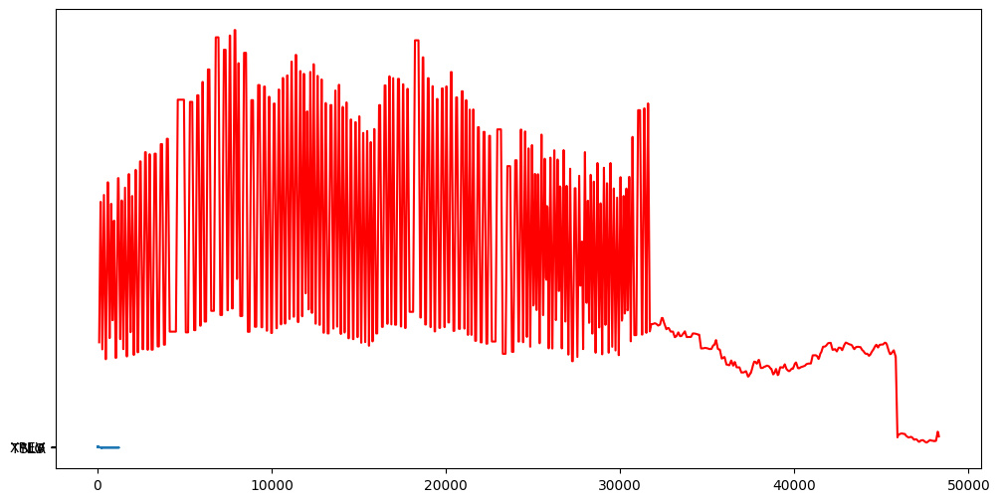

In [ ]:
plt.figure(figsize=(12,6))
plt.plot(ano_df['Close'],ano_df['Stock Name'])
plt.plot(ma100, 'r')

In [ ]:
data_training = pd.DataFrame(ano_df['Close'][0:int(len(ano_df)*0.70)])
data_testing = pd.DataFrame(ano_df['Close'][int(len(ano_df)*0.70):int(len(ano_df))])

In [ ]:
data_training.shape,data_testing.shape

((33810, 1), (14490, 1))

In [ ]:
data_training.head(),data_testing.head()

(        Close
 0  258.493347
 1  258.493347
 2  258.493347
 3  258.493347
 4  258.493347,
             Close
 33810  325.733337
 33811  325.733337
 33812  325.733337
 33813  325.733337
 33814  325.733337)

In [ ]:
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler(feature_range=(0,1))

In [ ]:
data_training_array = scaler.fit_transform(data_training)
data_training_array

array([[0.00391021],
       [0.00391021],
       [0.00391021],
       ...,
       [0.07285804],
       [0.07285804],
       [0.07285804]])

In [ ]:
x_train = []
y_train = []

In [ ]:
for i in range(100, data_training_array.shape[0]):
    x_train.append(data_training_array[i-100:i])
    y_train.append(data_training_array[i,0])
x_train,y_train = np.array(x_train), np.array(y_train)

In [ ]:
x_train.shape,y_train.shape

((33710, 100, 1), (33710,))

In [ ]:
x_train[0]

array([[0.00391021],
       [0.00391021],
       [0.00391021],
       [0.00391021],
       [0.00391021],
       [0.00391021],
       [0.00391021],
       [0.00391021],
       [0.00391021],
       [0.00391021],
       [0.00391021],
       [0.00391021],
       [0.00391021],
       [0.00391021],
       [0.00391021],
       [0.00391021],
       [0.00391021],
       [0.00391021],
       [0.00391021],
       [0.00391021],
       [0.00391021],
       [0.00391021],
       [0.00391021],
       [0.00391021],
       [0.00391021],
       [0.00391021],
       [0.00391021],
       [0.00391021],
       [0.00391021],
       [0.00391021],
       [0.00391021],
       [0.00391021],
       [0.00391021],
       [0.00391021],
       [0.00391021],
       [0.00391021],
       [0.00391021],
       [0.00391021],
       [0.00391021],
       [0.00391021],
       [0.00391021],
       [0.00391021],
       [0.00391021],
       [0.00391021],
       [0.00391021],
       [0.00391021],
       [0.00391021],
       [0.003

In [ ]:
y_train

array([0.53402783, 0.53402783, 0.53402783, ..., 0.07285804, 0.07285804,
       0.07285804])

In [ ]:
model = Sequential()
model.add(LSTM(units=50,activation='relu',return_sequences=True,input_shape = (x_train.shape[1],1)))
model.add(Dropout(0.2))
model.add(LSTM(units = 60,activation = 'relu',return_sequences=True))
model.add(Dropout(0.3))
model.add(LSTM(units = 80,activation = 'relu',return_sequences=True))
model.add(Dropout(0.4))
model.add(LSTM(units = 120,activation = 'relu'))
model.add(Dropout(0.5))
model.add(Dense(units=1))

In [ ]:
model.compile(loss='mean_squared_error',optimizer='adam')

In [ ]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm (LSTM)                 (None, 100, 50)           10400     
                                                                 
 dropout (Dropout)           (None, 100, 50)           0         
                                                                 
 lstm_1 (LSTM)               (None, 100, 60)           26640     
                                                                 
 dropout_1 (Dropout)         (None, 100, 60)           0         
                                                                 
 lstm_2 (LSTM)               (None, 100, 80)           45120     
                                                                 
 dropout_2 (Dropout)         (None, 100, 80)           0         
                                                                 
 lstm_3 (LSTM)               (None, 120)               9

In [ ]:
model.fit(x_train,y_train,epochs=10,batch_size=32)

Epoch 1/10
1054/1054 [==============================] - 225s 209ms/step - loss: 0.0224
Epoch 2/10
1054/1054 [==============================] - 246s 234ms/step - loss: 0.0110
Epoch 3/10
1054/1054 [==============================] - 251s 238ms/step - loss: 0.0082
Epoch 4/10
1054/1054 [==============================] - 256s 243ms/step - loss: 0.0072
Epoch 5/10
1054/1054 [==============================] - 264s 250ms/step - loss: 0.0069
Epoch 6/10
1054/1054 [==============================] - 266s 252ms/step - loss: 0.0064
Epoch 7/10
1054/1054 [==============================] - 254s 241ms/step - loss: 0.0062
Epoch 8/10
1054/1054 [==============================] - 258s 245ms/step - loss: 0.0061
Epoch 9/10
1054/1054 [==============================] - 258s 245ms/step - loss: 0.0060
Epoch 10/10
1054/1054 [==============================] - 253s 240ms/step - loss: 0.0059


In [ ]:
model.save('BILSTM_model.h5')

In [ ]:
past_100_days = data_training.tail(100)

In [ ]:
final_df = pd.concat([past_100_days, data_testing], ignore_index=True)
final_df.shape

(14590, 1)

In [ ]:
final_df.head()

,Close
0,342.716675
1,342.716675
2,342.716675
3,342.716675
4,342.716675


In [ ]:
input_data = scaler.fit_transform(final_df)
input_data.shape

(14590, 1)

In [ ]:
x_test = []
y_test = []

for i in range(100,input_data.shape[0]):
    x_test.append(input_data[i-100:i])
    y_test.append(input_data[i,0])

In [ ]:
x_test,y_test = np.array(x_test), np.array(y_test)
x_test.shape,y_test.shape

((14490, 100, 1), (14490,))

In [ ]:
x_test

array([[[1.        ],
        [1.        ],
        [1.        ],
        ...,
        [0.9487816 ],
        [0.9487816 ],
        [0.9487816 ]],

       [[1.        ],
        [1.        ],
        [1.        ],
        ...,
        [0.9487816 ],
        [0.9487816 ],
        [0.9487816 ]],

       [[1.        ],
        [1.        ],
        [1.        ],
        ...,
        [0.9487816 ],
        [0.9487816 ],
        [0.9487816 ]],

       ...,

       [[0.12066227],
        [0.11206723],
        [0.11206723],
        ...,
        [0.0234931 ],
        [0.02150267],
        [0.01468696]],

       [[0.11206723],
        [0.11206723],
        [0.09852627],
        ...,
        [0.02150267],
        [0.01468696],
        [0.01577265]],

       [[0.11206723],
        [0.09852627],
        [0.09852627],
        ...,
        [0.01468696],
        [0.01577265],
        [0.01360127]]])

In [ ]:
y_predict = model.predict(x_test)

453/453 [==============================] - 37s 79ms/step


In [ ]:
y_predict_inveres = scaler.inverse_transform(y_predict)

In [ ]:
y_predict_inveres

array([[300.76398 ],
       [300.76398 ],
       [300.764   ],
       ...,
       [ 42.903244],
       [ 42.45917 ],
       [ 41.996902]], dtype=float32)

In [ ]:
scale_factor = 1/ scaler.scale_[0]

Text(0, 0.5, 'Price')

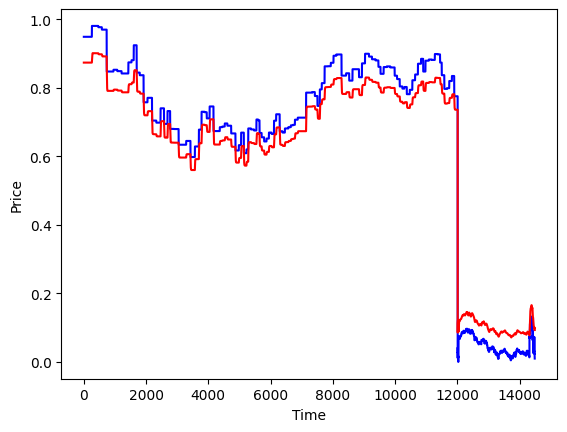

In [ ]:
plt.plot(y_test,'b',label = 'original price')
plt.plot(y_predict,'r',label = 'predicted price')
plt.xlabel('Time')
plt.ylabel('Price')

MAE and MSE

In [ ]:
from sklearn.metrics import mean_absolute_error,mean_squared_error

mae = mean_absolute_error(y_test, y_predict)
print(f'Mean Absolute Error: {mae:.4f}')
mse = mean_squared_error(y_test, y_predict)
print(f'Mean Squared Error: {mse:.4f}')


Mean Absolute Error: 0.0508
Mean Squared Error: 0.0028


In [ ]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

In [ ]:
fig = make_subplots(rows=2, cols=1)
fig.add_trace(go.Ohlc(x=stock.Date,
                      open=stock.Open,
                      high=stock.High,
                      low=stock.Low,
                      close=stock.Close,
                      name='Price'), row=1, col=1)

fig.add_trace(go.Scatter(x=stock.Date, y=stock.Volume, name='Volume'), row=2, col=1)

fig.update_layout(title_text="Automobile Stock Price and Volume")
fig.update(layout_xaxis_rangeslider_visible=False)
fig.show()

In [ ]:
data_testing.head()

,Close
33810,325.733337
33811,325.733337
33812,325.733337
33813,325.733337
33814,325.733337


In [ ]:
past_100_days = data_training.tail(100)

AutoEncoder Model

In [ ]:
class AnomalyDetector(Model):
  def __init__(self):
    super(AnomalyDetector, self).__init__()
    self.encoder = tf.keras.Sequential([
      layers.Dense(16, activation="relu"),
      layers.Dense(8, activation="relu")])

    self.decoder = tf.keras.Sequential([
      layers.Dense(16, activation="relu"),
      layers.Dense(30, activation="sigmoid")])

  def call(self, x):
    encoded = self.encoder(x)
    decoded = self.decoder(encoded)
    return decoded

autoencoder = AnomalyDetector()

In [ ]:
autoencoder.compile(optimizer='adam', loss='mae')

In [ ]:
def normalize_window_roll(data, window_size):
    X = []
    Y = []
    for i in range(0,len(data) - window_size,5):
        x_window = data.iloc[i:i+window_size]

        # Normalize the x_window and y_window
        scaler = MinMaxScaler()
        x_window = scaler.fit_transform(np.array(x_window).reshape(-1, 1))

        X.append(x_window)
    X =np.squeeze(np.array(X), axis=2)

    return X

In [ ]:
X= normalize_window_roll(ano_df['Close'],30)

In [ ]:
X.shape

(9654, 30)

In [ ]:
train_size = int(0.7*X.shape[0])
test_size = int(0.1*X.shape[0])
val_size = int(0.2*X.shape[0])

X_train = X[:train_size]
X_test = X[train_size:train_size+test_size]
X_val = X[train_size+test_size:train_size+test_size+val_size]

In [ ]:

X_train.shape,X_test.shape,X_val.shape

((6757, 30), (965, 30), (1930, 30))

In [ ]:
early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_loss',
                                                  patience=2,
                                                  mode='min')
autoencoder.compile(optimizer='adam', loss='mae')

history = autoencoder.fit(X_train,X_train, epochs=40,
                    validation_data=(X_val, X_val),
                    batch_size=16,
                    callbacks=[early_stopping])

Epoch 1/40
423/423 [==============================] - 4s 6ms/step - loss: 0.1934 - val_loss: 0.1345
Epoch 2/40
423/423 [==============================] - 2s 4ms/step - loss: 0.0279 - val_loss: 0.0649
Epoch 3/40
423/423 [==============================] - 2s 4ms/step - loss: 0.0103 - val_loss: 0.0615
Epoch 4/40
423/423 [==============================] - 2s 5ms/step - loss: 0.0075 - val_loss: 0.0604
Epoch 5/40
423/423 [==============================] - 2s 4ms/step - loss: 0.0063 - val_loss: 0.0599
Epoch 6/40
423/423 [==============================] - 1s 3ms/step - loss: 0.0056 - val_loss: 0.0595
Epoch 7/40
423/423 [==============================] - 2s 4ms/step - loss: 0.0051 - val_loss: 0.0592
Epoch 8/40
423/423 [==============================] - 2s 4ms/step - loss: 0.0047 - val_loss: 0.0589
Epoch 9/40
423/423 [==============================] - 2s 4ms/step - loss: 0.0045 - val_loss: 0.0583
Epoch 10/40
423/423 [==============================] - 2s 4ms/step - loss: 0.0043 - val_loss: 0.0584

212/212 [==============================] - 1s 2ms/step


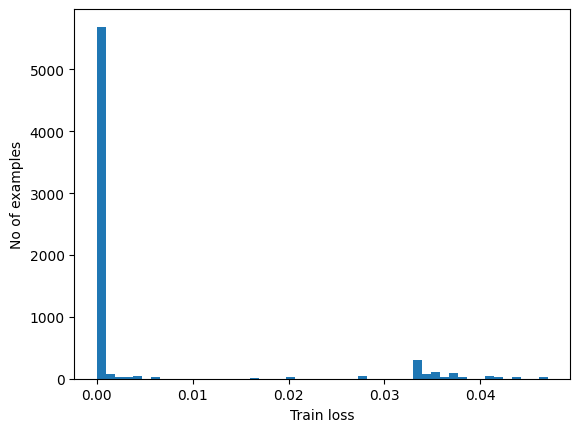

In [ ]:
reconstructions = autoencoder.predict(X_train)
train_loss = tf.keras.losses.mae(reconstructions, X_train)

plt.hist(train_loss[None,:], bins=50)
plt.xlabel("Train loss")
plt.ylabel("No of examples")
plt.show()

In [ ]:
threshold = np.mean(train_loss) + np.std(train_loss)
print("Threshold: ", threshold)

Threshold:  0.016392560793836337


31/31 [==============================] - 0s 3ms/step


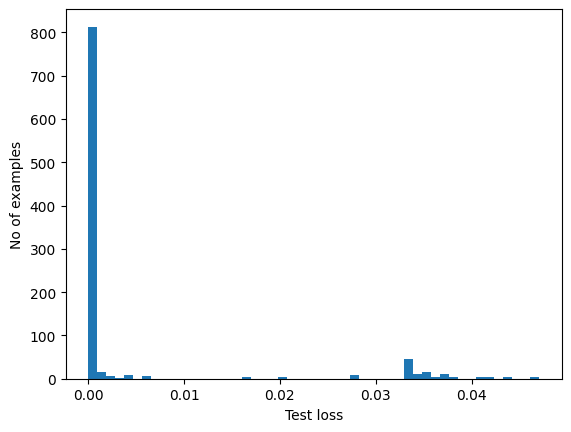

In [ ]:
reconstructions = autoencoder.predict(X_test)
test_loss = tf.keras.losses.mae(reconstructions, X_test)

plt.hist(test_loss[None, :], bins=50)
plt.xlabel("Test loss")
plt.ylabel("No of examples")
plt.show()

In [ ]:
def predict(model, data, threshold):
  reconstructions = model(data)
  loss = tf.keras.losses.mae(reconstructions, data)
  return tf.math.less(loss, threshold)


In [ ]:
from sklearn.metrics import mean_absolute_error,mean_squared_error

mae = mean_absolute_error(y_test, y_predict)
print(f'Mean Absolute Error: {mae:.4f}')
mse = mean_squared_error(y_test, y_predict)
print(f'Mean Squared Error: {mse:.4f}')


Mean Absolute Error: 0.0508
Mean Squared Error: 0.0028


Prediction of Stocks

In [ ]:
preds = predict(autoencoder, X_test, threshold)

In [ ]:
anomalous_test_data = X_test[np.where(preds==False)]

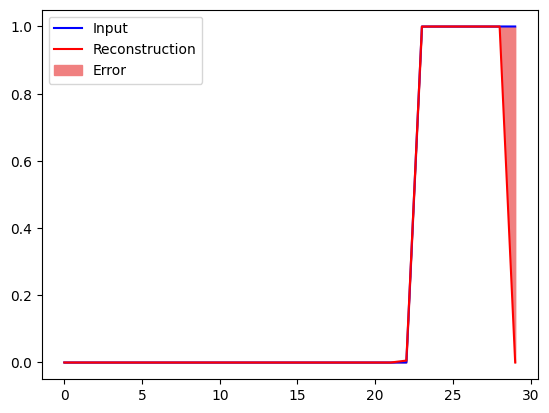

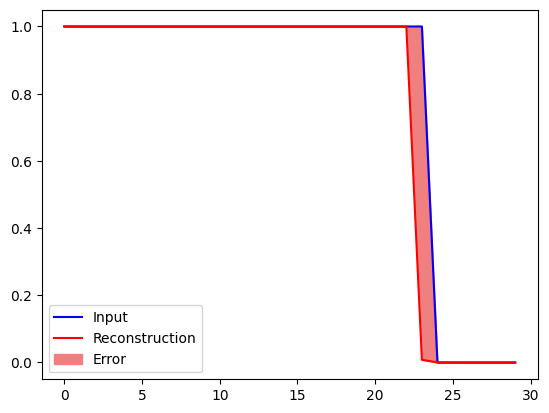

In [ ]:
encoded_data = autoencoder.encoder(anomalous_test_data).numpy()
decoded_data = autoencoder.decoder(encoded_data).numpy()

for p in [1,10]:
  plt.plot(anomalous_test_data[p], 'b')
  plt.plot(np.arange(0,X.shape[1]),decoded_data[p], 'r')
  plt.fill_between(np.arange(X.shape[1]), decoded_data[p], anomalous_test_data[p], color='lightcoral')
  plt.legend(labels=["Input", "Reconstruction", "Error"])
  plt.show()

ML model for Anomally Detection

In [ ]:
from sklearn.ensemble import IsolationForest

In [ ]:
ano_df.head()

,Date,Close,Stock Name
0,2021-09-30,258.493347,TSLA
1,2021-09-30,258.493347,TSLA
2,2021-09-30,258.493347,TSLA
3,2021-09-30,258.493347,TSLA
4,2021-09-30,258.493347,TSLA


In [ ]:
ano_df.drop(columns=['index'],inplace=True)

In [ ]:
data = ano_df.copy()

In [ ]:
data.reset_index(inplace=True)

In [ ]:
data.head()

,Date,Close,Stock Name
0,2021-09-30,258.493347,TSLA
1,2021-09-30,258.493347,TSLA
2,2021-09-30,258.493347,TSLA
3,2021-09-30,258.493347,TSLA
4,2021-09-30,258.493347,TSLA


In [ ]:
#data.drop(columns=['index'],inplace=True)

In [ ]:
ano_df.columns

Index(['Date', 'Close', 'Stock Name'], dtype='object')

In [ ]:
#ano_df.reset_index(inplace=True)

In [ ]:
unique_stock_names = ano_df['Stock Name'].unique()

In [ ]:
unique_stock_names

array(['TSLA', 'F', 'NIO', 'XPEV'], dtype=object)

In [ ]:
model = IsolationForest(contamination=0.05, random_state=42)

In [ ]:
anomalies_info = {}

In [ ]:
data

,Date,Close,Stock Name
0,2021-09-30,258.493347,TSLA
1,2021-09-30,258.493347,TSLA
2,2021-09-30,258.493347,TSLA
3,2021-09-30,258.493347,TSLA
4,2021-09-30,258.493347,TSLA
...,...,...,...
48295,2022-08-30,18.260000,XPEV
48296,2022-09-07,16.000000,XPEV
48297,2022-09-12,16.360001,XPEV
48298,2022-09-19,15.640000,XPEV


In [ ]:
unique_stock_names

array(['TSLA', 'F', 'NIO', 'XPEV'], dtype=object)

In [ ]:
pd.DataFrame(anomalies_info)

,TSLA,F,NIO,XPEV
Date,6687 2021-11-01 6688 2021-11-01 6689 ...,45827 2022-01-14 45843 2022-06-30 Name: Da...,46088 2021-11-04 46089 2021-11-04 46090 ...,48183 2021-11-24 48184 2021-11-24 48185 ...
Close Price,6687 1208.589966 6688 1208.589966 6689...,45827 25.190001 45843 11.130000 Name: Cl...,46088 43.119999 46089 43.119999 46090 ...,48183 54.369999 48184 54.369999 48185 ...


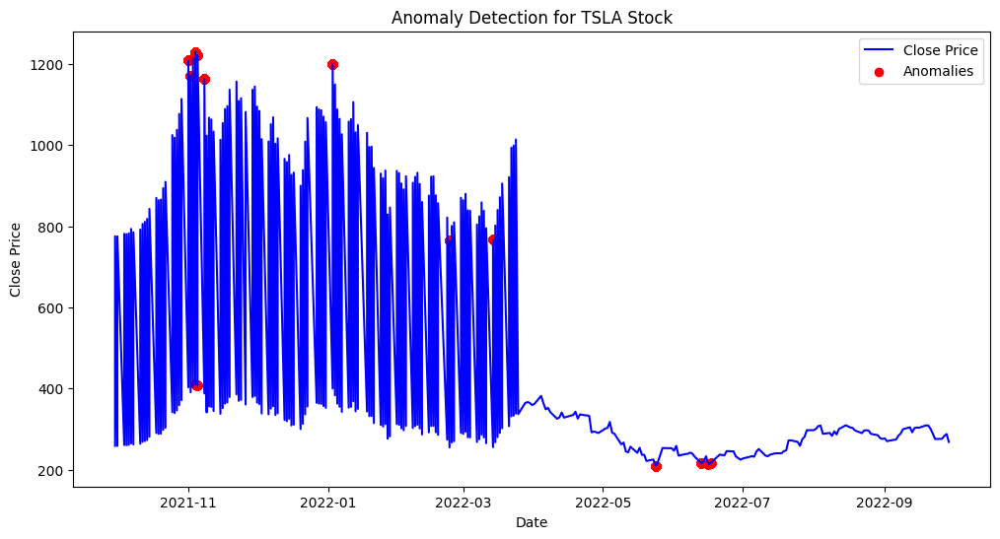

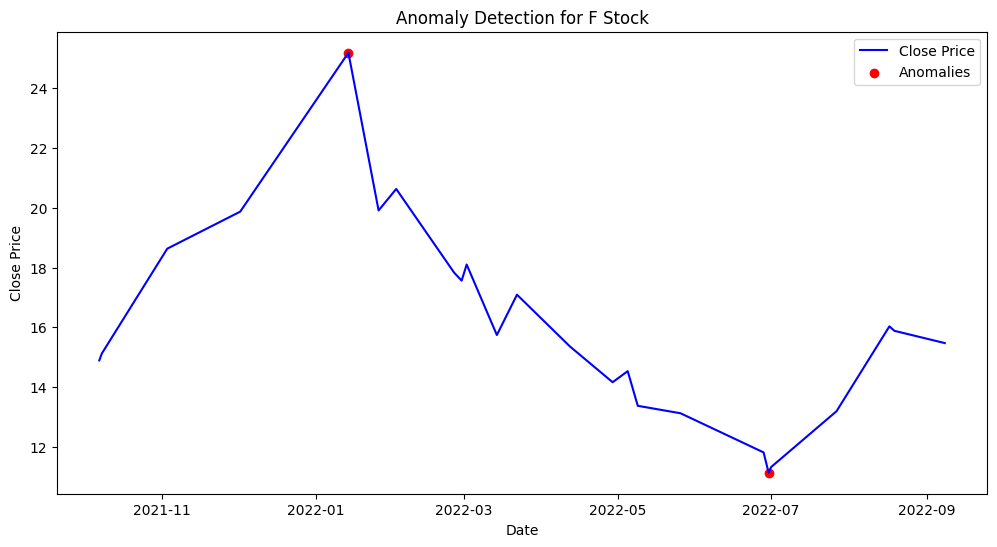

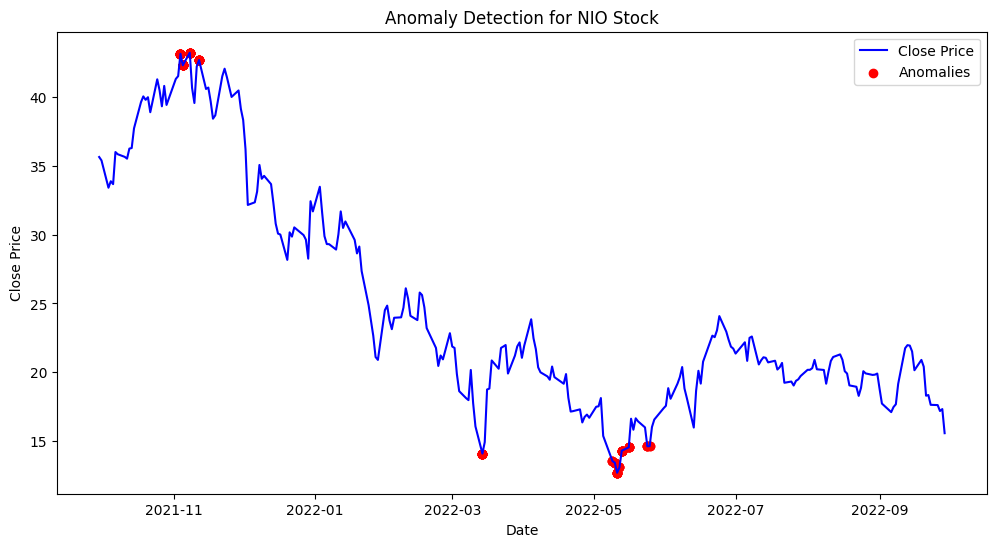

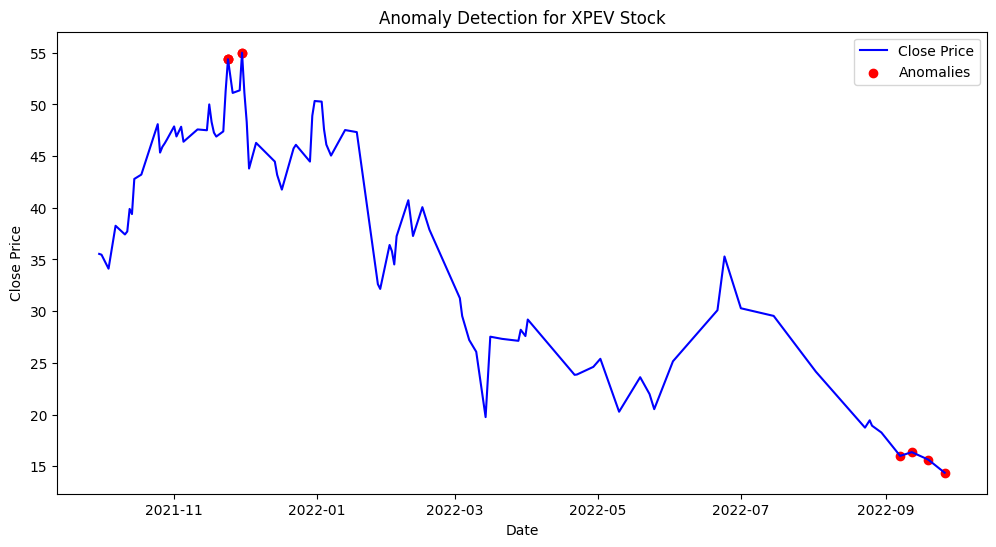

In [ ]:
for stock_name in unique_stock_names:
    stock_data = data[data['Stock Name'] == stock_name]

    close_prices = stock_data['Close'].values.reshape(-1, 1)
    model.fit(close_prices)

    anomaly_predictions = model.predict(close_prices)

    stock_data['Anomaly'] = anomaly_predictions

    anomalies_info[stock_name] = {
        'Date': stock_data['Date'][anomaly_predictions == -1],
        'Close Price': stock_data['Close'][anomaly_predictions == -1]
    }

    plt.figure(figsize=(12, 6))
    plt.plot(stock_data['Date'], stock_data['Close'], label='Close Price', color='blue')
    plt.scatter(stock_data['Date'][anomaly_predictions == -1], stock_data['Close'][anomaly_predictions == -1], color='red', label='Anomalies')
    plt.xlabel('Date')
    plt.ylabel('Close Price')
    plt.title(f'Anomaly Detection for {stock_name} Stock')
    plt.legend()
    plt.show()




In [ ]:
from sklearn.metrics import mean_absolute_error,mean_squared_error

mae = mean_absolute_error(y_test, y_predict)
print(f'Mean Absolute Error: {mae:.4f}')
mse = mean_squared_error(y_test, y_predict)
print(f'Mean Squared Error: {mse:.4f}')


Mean Absolute Error: 0.0508
Mean Squared Error: 0.0028


In [ ]:
for stock_name, info in anomalies_info.items():
    print(f'Anomalies for {stock_name} stock:')
    anomalies_df = pd.DataFrame(info)
    print(anomalies_df)
    print("\n")

Anomalies for TSLA stock:
            Date  Close Price
6687  2021-11-01  1208.589966
6688  2021-11-01  1208.589966
6689  2021-11-01  1208.589966
6690  2021-11-01  1208.589966
6691  2021-11-01  1208.589966
...          ...          ...
39087 2022-06-17   216.759995
39088 2022-06-17   216.759995
39089 2022-06-17   216.759995
39090 2022-06-17   216.759995
39091 2022-06-17   216.759995

[2235 rows x 2 columns]


Anomalies for F stock:
            Date  Close Price
45827 2022-01-14    25.190001
45843 2022-06-30    11.130000


Anomalies for NIO stock:
            Date  Close Price
46088 2021-11-04    43.119999
46089 2021-11-04    43.119999
46090 2021-11-04    43.119999
46091 2021-11-04    43.119999
46092 2021-11-04    43.119999
...          ...          ...
47593 2022-05-24    14.630000
47594 2022-05-24    14.630000
47595 2022-05-24    14.630000
47596 2022-05-25    14.640000
47597 2022-05-25    14.640000

[110 rows x 2 columns]


Anomalies for XPEV stock:
            Date  Close Price
48183

In [ ]:
from statsmodels.tsa.arima.model import ARIMA

In [ ]:
anomalies

,Tweet,Stock Name,Company Name,Sentiment,Sentiment_score,Z-Score
Date,,,,,,
2022-09-29 22:40:07+00:00,@RealDanODowd @WholeMarsBlog @Tesla Hahaha why...,TSLA,"Tesla, Inc.",Positive,-0.7568,-2.095361
2022-09-29 22:27:05+00:00,"@RealDanODowd @Tesla Stop trying to kill kids,...",TSLA,"Tesla, Inc.",Negative,-0.8750,-2.359307
2022-09-29 22:24:22+00:00,For years @WholeMarsBlog viciously silenced @T...,TSLA,"Tesla, Inc.",Negative,-0.9359,-2.495299
2022-09-29 22:15:01+00:00,@MrJames__321 @KellyRoofing @TeslaSolar @elonm...,TSLA,"Tesla, Inc.",Negative,-0.8625,-2.331394
2022-09-29 21:11:30+00:00,$TSLAQ: Tesla’s dead in Europe! Everyone else ...,TSLA,"Tesla, Inc.",Negative,-0.7332,-2.042662
...,...,...,...,...,...,...
2021-10-07 16:35:26+00:00,$NIO here we freaking go people the misery nee...,NIO,NIO Inc.,Neutral,-0.7777,-2.142032
2021-10-01 11:33:08+00:00,If you completely sold out of $NIO it may not ...,NIO,NIO Inc.,Positive,-0.8086,-2.211033
2022-08-25 01:53:36+00:00,Worst performing large cap stocks so far in 20...,XPEV,XPeng Inc.,Negative,-0.7184,-2.009613


In [ ]:
anomalies_info.items()

dict_items([('TSLA', {'Date': 6687    2021-11-01
6688    2021-11-01
6689    2021-11-01
6690    2021-11-01
6691    2021-11-01
           ...    
39087   2022-06-17
39088   2022-06-17
39089   2022-06-17
39090   2022-06-17
39091   2022-06-17
Name: Date, Length: 2235, dtype: datetime64[ns], 'Close Price': 6687     1208.589966
6688     1208.589966
6689     1208.589966
6690     1208.589966
6691     1208.589966
            ...     
39087     216.759995
39088     216.759995
39089     216.759995
39090     216.759995
39091     216.759995
Name: Close, Length: 2235, dtype: float64}), ('F', {'Date': 45827   2022-01-14
45843   2022-06-30
Name: Date, dtype: datetime64[ns], 'Close Price': 45827    25.190001
45843    11.130000
Name: Close, dtype: float64}), ('NIO', {'Date': 46088   2021-11-04
46089   2021-11-04
46090   2021-11-04
46091   2021-11-04
46092   2021-11-04
           ...    
47593   2022-05-24
47594   2022-05-24
47595   2022-05-24
47596   2022-05-25
47597   2022-05-25
Name: Date, Length: 110

In [ ]:

for stock_name, info in anomalies_info.items():
    print(stock_name)

TSLA
F
NIO
XPEV


# Create future features for the next 30 days

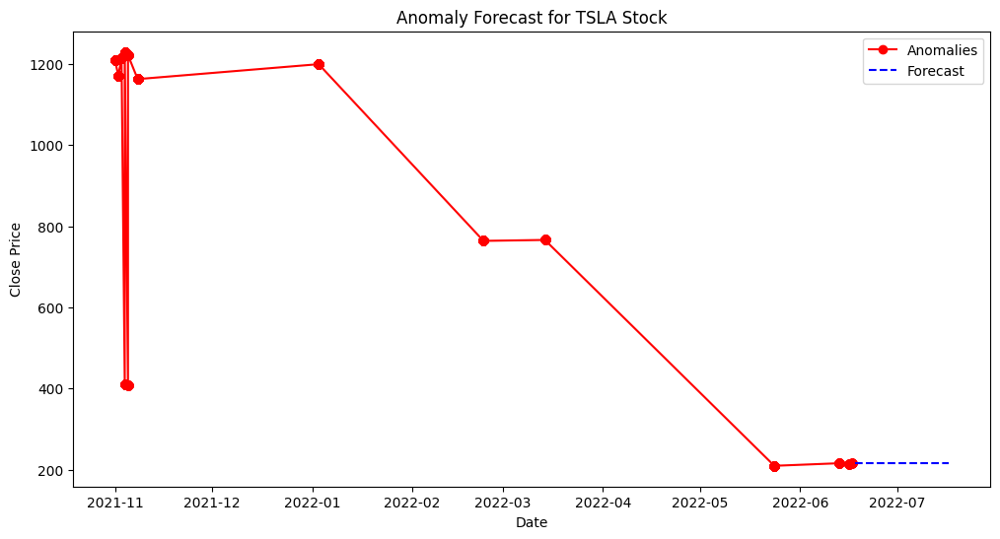

In [ ]:
stocks_of_interest = ['TSLA']

# Iterate over specified stocks
for stock_name in stocks_of_interest:
    # Check if the stock is in anomalies_info
    if stock_name in anomalies_info:
        info = anomalies_info[stock_name]
        stock_data = data[data['Stock Name'] == stock_name]

        # Assuming anomalies_info has 'Date' and 'Close Price' for anomalies
        anomalies_df = pd.DataFrame(info)

        # Convert 'Date' to datetime if it's not already
        anomalies_df['Date'] = pd.to_datetime(anomalies_df['Date'])

        # Create a time series from anomalies_df for forecasting
        time_series = anomalies_df.set_index('Date')['Close Price']

        # Fit ARIMA model
        model = ARIMA(time_series, order=(5, 1, 0))  # Adjust order based on your data
        result = model.fit()

        # Forecast the next 30 days
        forecast = result.get_forecast(steps=30)

        # Get forecast values and index
        forecast_values = forecast.predicted_mean
        forecast_index = pd.date_range(start=time_series.index[-1], periods=31, freq='D')[1:]

        # Plot the anomalies and forecast
        plt.figure(figsize=(12, 6))
        plt.plot(time_series.index, time_series, label='Anomalies', color='red', marker='o')
        plt.plot(forecast_index, forecast_values, label='Forecast', color='blue', linestyle='--')
        plt.xlabel('Date')
        plt.ylabel('Close Price')
        plt.title(f'Anomaly Forecast for {stock_name} Stock')
        plt.legend()
        plt.show()

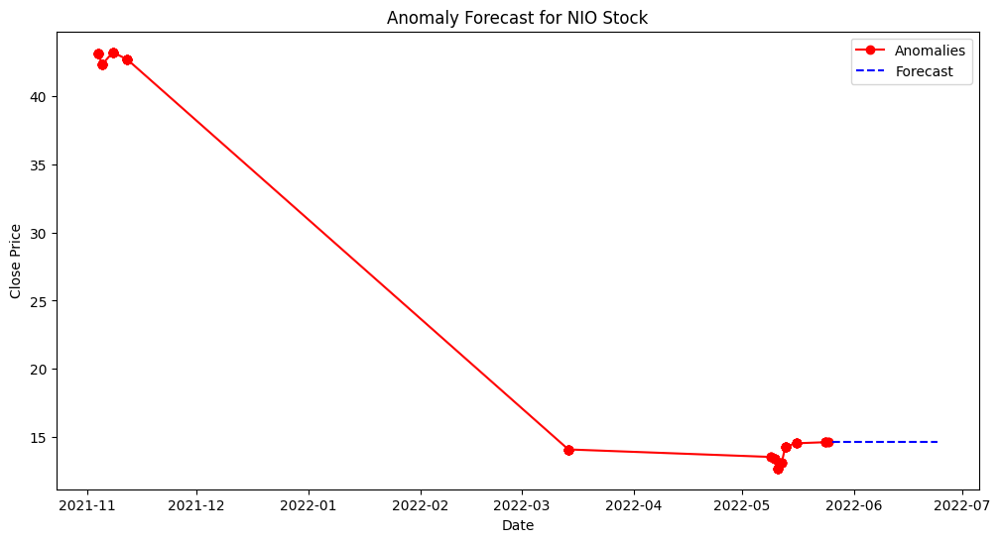

In [ ]:
stocks_of_interest = ['NIO']

# Iterate over specified stocks
for stock_name in stocks_of_interest:
    # Check if the stock is in anomalies_info
    if stock_name in anomalies_info:
        info = anomalies_info[stock_name]
        stock_data = data[data['Stock Name'] == stock_name]

        # Assuming anomalies_info has 'Date' and 'Close Price' for anomalies
        anomalies_df = pd.DataFrame(info)

        # Convert 'Date' to datetime if it's not already
        anomalies_df['Date'] = pd.to_datetime(anomalies_df['Date'])

        # Create a time series from anomalies_df for forecasting
        time_series = anomalies_df.set_index('Date')['Close Price']

        # Fit ARIMA model
        model = ARIMA(time_series, order=(5, 1, 0))
        result = model.fit()

        # Forecast the next 30 days
        forecast = result.get_forecast(steps=30)

        # Get forecast values and index
        forecast_values = forecast.predicted_mean
        forecast_index = pd.date_range(start=time_series.index[-1], periods=31, freq='D')[1:]

        # Plot the anomalies and forecast
        plt.figure(figsize=(12, 6))
        plt.plot(time_series.index, time_series, label='Anomalies', color='red', marker='o')
        plt.plot(forecast_index, forecast_values, label='Forecast', color='blue', linestyle='--')
        plt.xlabel('Date')
        plt.ylabel('Close Price')
        plt.title(f'Anomaly Forecast for {stock_name} Stock')
        plt.legend()
        plt.show()

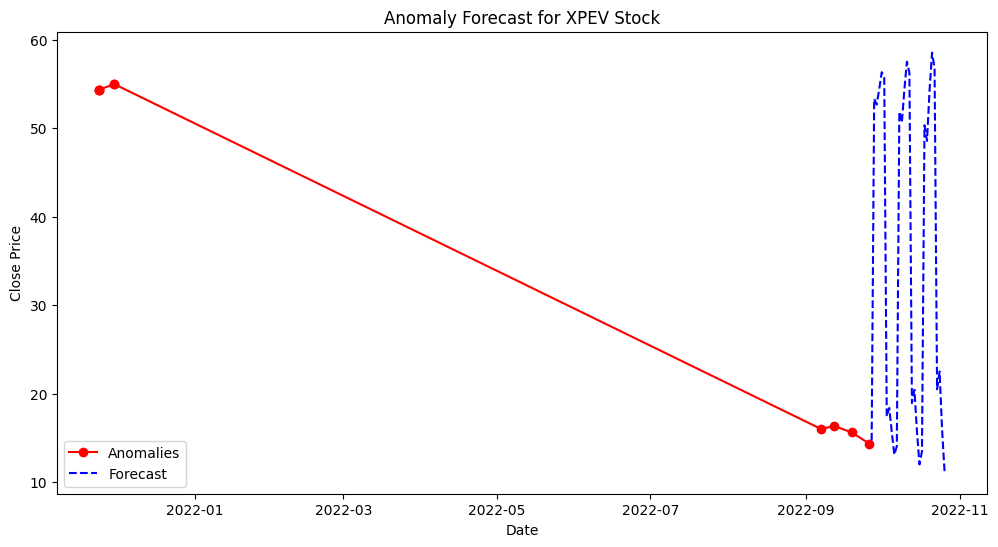

In [ ]:
stocks_of_interest = ['XPEV']

# Iterate over specified stocks
for stock_name in stocks_of_interest:
    # Check if the stock is in anomalies_info
    if stock_name in anomalies_info:
        info = anomalies_info[stock_name]
        stock_data = data[data['Stock Name'] == stock_name]

        # Assuming anomalies_info has 'Date' and 'Close Price' for anomalies
        anomalies_df = pd.DataFrame(info)

        # Convert 'Date' to datetime if it's not already
        anomalies_df['Date'] = pd.to_datetime(anomalies_df['Date'])

        # Create a time series from anomalies_df for forecasting
        time_series = anomalies_df.set_index('Date')['Close Price']

        # Fit ARIMA model
        model = ARIMA(time_series, order=(5, 1, 0))
        result = model.fit()

        # Forecast the next 30 days
        forecast = result.get_forecast(steps=30)

        # Get forecast values and index
        forecast_values = forecast.predicted_mean
        forecast_index = pd.date_range(start=time_series.index[-1], periods=31, freq='D')[1:]

        # Plot the anomalies and forecast
        plt.figure(figsize=(12, 6))
        plt.plot(time_series.index, time_series, label='Anomalies', color='red', marker='o')
        plt.plot(forecast_index, forecast_values, label='Forecast', color='blue', linestyle='--')
        plt.xlabel('Date')
        plt.ylabel('Close Price')
        plt.title(f'Anomaly Forecast for {stock_name} Stock')
        plt.legend()
        plt.show()

In [ ]:
for stock_name, info in anomalies_info.items():
    anomalies_df = pd.DataFrame(info)
    anomalies_df.to_csv(f'anomalies_{stock_name}.csv', index=False)

Time Series Forecasting Plot:

Anomalies for TSLA stock:
Summary Statistics for TSLA:
count    2235.000000
mean      893.309534
std       405.429816
min       209.386673
25%       409.970001
50%      1172.000000
75%      1208.589966
max      1229.910034
Name: Close Price, dtype: float64


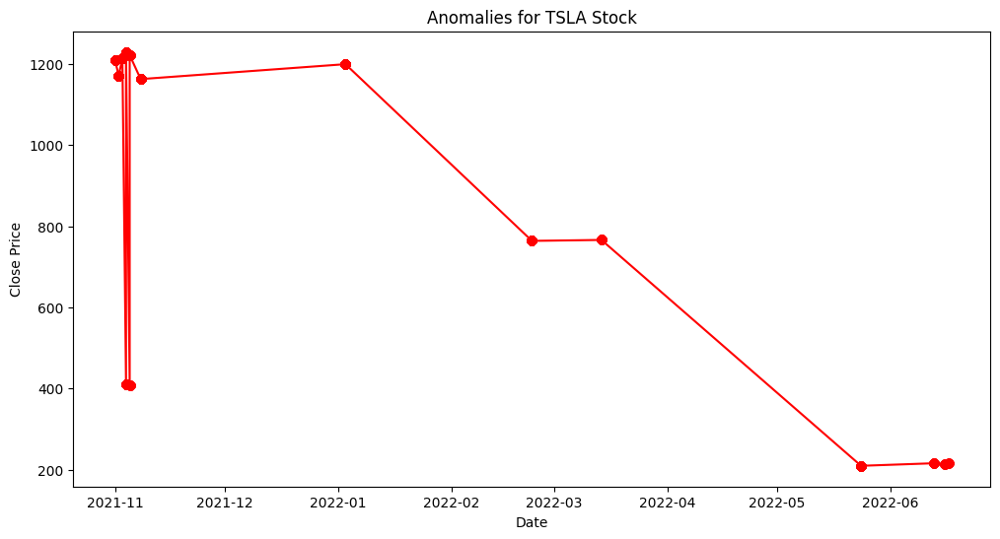

In [ ]:
for stock_name, anomalies_data in anomalies_info.items():
    print(f'Anomalies for {stock_name} stock:')
    anomalies_df = pd.DataFrame(anomalies_data)
    summary_stats = anomalies_df['Close Price'].describe()
    print(f'Summary Statistics for {stock_name}:')
    print(summary_stats)
    plt.figure(figsize=(12, 6))
    plt.plot(anomalies_df['Date'], anomalies_df['Close Price'], marker='o', linestyle='-', color='red')
    plt.xlabel('Date')
    plt.ylabel('Close Price')
    plt.title(f'Anomalies for {stock_name} Stock')
    plt.show()

    print("\n")

In [ ]:
ano_df

,Date,Close,Stock Name
0,2021-09-30,258.493347,TSLA
1,2021-09-30,258.493347,TSLA
2,2021-09-30,258.493347,TSLA
3,2021-09-30,258.493347,TSLA
4,2021-09-30,258.493347,TSLA
...,...,...,...
48295,2022-08-30,18.260000,XPEV
48296,2022-09-07,16.000000,XPEV
48297,2022-09-12,16.360001,XPEV
48298,2022-09-19,15.640000,XPEV


In [ ]:

import pandas as pd
import matplotlib.pyplot as plt
from statsmodels.tsa.arima.model import ARIMA

In [ ]:
data = ano_df.copy()

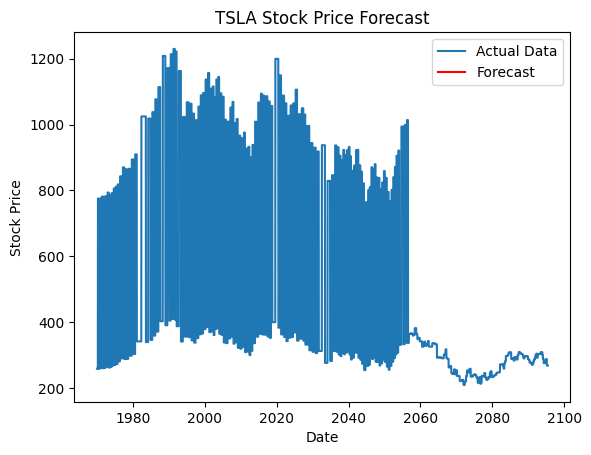

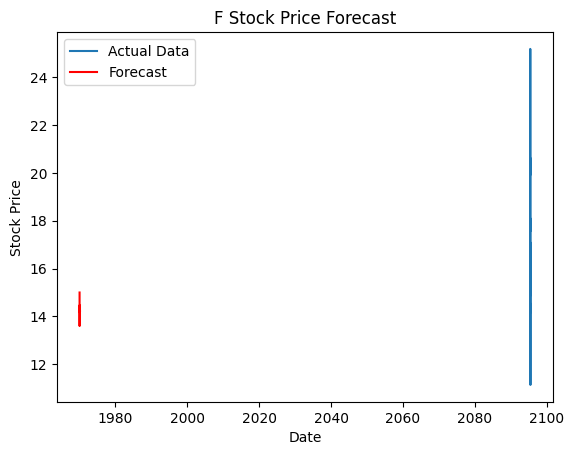

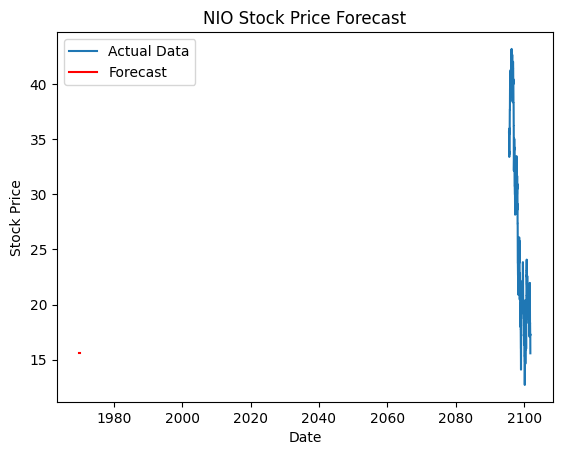

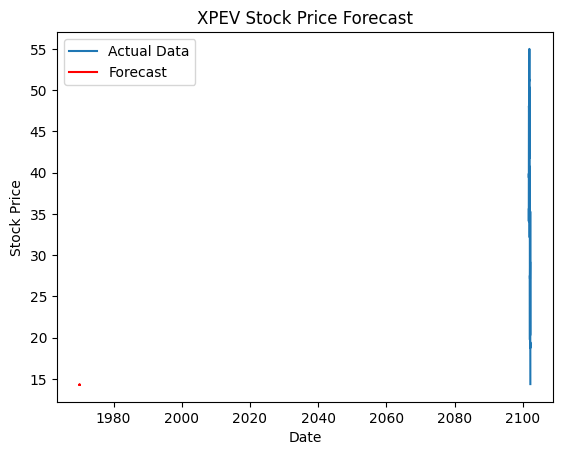

In [ ]:

# Iterate over unique stock names
for stock_name in data['Stock Name'].unique():
    stock_data = data[data['Stock Name'] == stock_name]['Close']

    # Fit ARIMA model
    model = ARIMA(stock_data, order=(5,1,0))
    result = model.fit()

    # Forecast the next 30 days
    forecast = result.get_forecast(steps=30)

    # Get forecast values and index
    forecast_values = forecast.predicted_mean
    forecast_index = pd.date_range(start=stock_data.index[-1], periods=31, freq='D')[1:]

    # Plot the original data and forecast
    plt.plot(stock_data.index, stock_data, label='Actual Data')
    plt.plot(forecast_index, forecast_values, color='red', label='Forecast')
    plt.xlabel('Date')
    plt.ylabel('Stock Price')
    plt.title(f'{stock_name} Stock Price Forecast')
    plt.legend()
    plt.show()
